In [2]:
%load_ext autoreload
%autoreload 2
import os; import sys; sys.path.insert(0,'../')
import pandas as pd
import numpy as np
import tqdm
import warnings
#warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

import atomic.features as fs
import matplotlib.pyplot as plt
import pattern.vis as vis
import sklearn.mixture as mix
import matplotsoccer as mps
import atomic.vaep as vaep
import pattern.action as pat
import atomic.atomic_spadl as ato
import pattern.wgmm as wgmm

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
## Configure file and folder names
datafolder = "../data/private"
spadl_h5 = os.path.join(datafolder,"spadl-statsbomb.h5")

In [4]:
games = pd.read_hdf(spadl_h5,"games")
games = games[(games.competition_name == "Premier League")
             & (games.season_name == "2018/2019")]
print("nb of games:", len(games))

actiontypes = pd.read_hdf(spadl_h5, "atomic_actiontypes")
#actiontypes = pd.read_hdf(spadl_h5, "actiontypes")
bodyparts = pd.read_hdf(spadl_h5, "bodyparts")

nb of games: 380


In [5]:
with pd.HDFStore(spadl_h5) as spadlstore:
    actions = []
    for game in tqdm.tqdm(games.itertuples()):
        a = spadlstore[f"atomic_actions/game_{game.game_id}"]
        [a] = fs.play_left_to_right([a],game.home_team_id)
        a["is_home"] = a.team_id == game.home_team_id
        actions.append(a)
    actions = pd.concat(actions)
    actions = actions.merge(spadlstore["atomic_actiontypes"],how="left")
actions[:5]

380it [00:09, 39.14it/s]


,game_id,period_id,action_id,time_seconds,timestamp,team_id,player_id,x,y,dx,dy,type_id,bodypart_id,is_home,type_name
0,14562.0,1.0,0,1.0,00:00:01.344,58.0,9923.0,52.058824,34.430380,-10.588235,-0.000000,0,0,False,pass
1,14562.0,1.0,1,1.5,00:00:02.117,58.0,9917.0,41.470588,34.430380,-0.000000,-0.000000,23,0,False,receival
2,14562.0,1.0,2,2.0,00:00:02.117,58.0,9917.0,41.470588,34.430380,-0.000000,-0.000000,21,0,False,dribble
3,14562.0,1.0,3,2.0,00:00:02.969,58.0,9917.0,41.470588,34.430380,-15.882353,-14.632911,0,0,False,pass
4,14562.0,1.0,4,3.0,00:00:04.338,58.0,9924.0,25.588235,19.797468,-0.000000,-0.000000,23,0,False,receival


In [8]:
# Make a nice action subset
import pattern.action as pat

a = actions[550000:600000].fillna(0)
#a = actions.fillna(0)
a = pat.simplify(a)
#a["type_name"] = a.type_name.mask(~a.is_home,a.type_name + "_opp")
a["x"] = a.x.mask(a.type_name=="goal",105)
a["y"] = a.y.mask(a.type_name=="goal",34)
#a["dx"] = a.dx.mask(a.type_name=="shot",105-a.x)
#a["dy"] = a.dy.mask(a.type_name=="shot",32.5-a.y)

def fix_out_y(y):
    return 68 if 68 - y < y else 0

a["y"] = a.y.mask(a.type_name=="out",a.y.apply(fix_out_y))

import numpy as np
#a["x"] = a.x + np.random.normal(0,1,len(a))
#a["y"] = a.y + np.random.normal(0,1,len(a))
#a["dx"] = a.dx + (a.dx != 0).apply(int) * np.random.normal(0,1,len(a))
#a["dy"] = a.dy + (a.dy != 0).apply(int) * np.random.normal(0,1,len(a))

#a = pd.concat([a,fs.polar(a),fs.movement_polar(a),fs.direction(a)],axis=1)
mirror_a = a.copy()
mirror_a["y"] = 68 - mirror_a["y"]
mirror_a["dy"] = - mirror_a["dy"]
a = pd.concat([a,mirror_a],axis=0)
a = pd.concat([a,fs.polar(a),fs.movement_polar(a),fs.direction(a)],axis=1)
a = a[~(((a.type_name == "dribble") | (a.type_name == "pass")) & (a.mov_d_a0 < 5))]

In [11]:
import sklearn
import sklearn.mixture as mix
from sklearn.mixture._gaussian_mixture import (
    _estimate_gaussian_parameters,
    _compute_precision_cholesky,
    )
import numpy as np
import numpy.linalg as linalg

import sklearn.cluster as cluster


import pandas as pd
import numpy as np

import cvxpy as cp

class WeightedGMM(mix.GaussianMixture):
    
    def fit(self,X,weights=None,*k,**kw):
        if weights is None:
            weights = np.zeros(len(X)) + 1
        pos_weight_idx = weights > 1e-10
        self.Xweights = weights[pos_weight_idx]
        return super().fit(X[pos_weight_idx],*k,**kw)
        
    def _m_step(self, X, log_resp):
            """M step.
            Parameters
            ----------
            X : array-like, shape (n_samples, n_features)
            log_resp : array-like, shape (n_samples, n_components)
                Logarithm of the posterior probabilities (or responsibilities) of
                the point of each sample in X.
            """
            resp = (self.Xweights*np.exp(log_resp).T).T
            self.weights_, self.means_, self.covariances_ = (
                _estimate_gaussian_parameters(X,resp, self.reg_covar,
                                              self.covariance_type))
            
            self.weights_ /= np.sum(self.Xweights)
                
            self.precisions_cholesky_ = _compute_precision_cholesky(
                self.covariances_, self.covariance_type)
            
    def _initialize_parameters(self, X, random_state):
            """Initialize the model parameters.
            Parameters
            ----------
            X : array-like, shape  (n_samples, n_features)
            random_state : RandomState
                A random number generator instance.
            """
            n_samples, _ = X.shape

            if self.init_params == 'kmeans':
                resp = np.zeros((n_samples, self.n_components))
                clus = cluster.KMeans(n_clusters=self.n_components, n_init=20,
                                       random_state=random_state)
                label = clus.fit(X,sample_weight=self.Xweights).labels_
                resp[np.arange(n_samples), label] = 1
            elif self.init_params == 'random':
                resp = random_state.rand(n_samples, self.n_components)
                resp /= resp.sum(axis=1)[:, np.newaxis]
            else:
                raise ValueError("Unimplemented initialization method '%s'"
                                 % self.init_params)

            self._initialize(X, resp)
            
    def score_samples(self,X,weights=None,err=1e-10):
        if weights is None:
            weights = np.zeros(len(X)) + 1
        pos_weights_idx = weights > err
        
        scores = np.zeros(len(X))
        pos_weights = weights[pos_weights_idx]
        pos_scores = super().score_samples(X[pos_weights_idx])
        scores[pos_weights_idx] = (pos_weights*pos_scores.T).T
        return scores
    
    def predict_proba(self,X,weights=None,err=1e-10):
        if weights is None:
            weights = np.zeros(len(X)) + 1
        pos_weights_idx = weights > err
        
        p = np.zeros((len(X),self.n_components))
        pos_weights = weights[pos_weights_idx]
        pos_probs = super().predict_proba(X[pos_weights_idx])
        p[pos_weights_idx,:] = (pos_weights*pos_probs.T).T
        return p
    
def learn_wgmm(df,columns,weights_df,weights_column,n_components,n_init=1):
    model = WeightedGMM(n_components=n_components,n_init = n_init)
    a = df[columns].values
    w = weights_df[weights_column].values
    model.fit(a,w)
    model.likelihood = model.score_samples(a,w).sum()
    model.name = weights_column
    return model

def probabilities(models):
    weights = []
    for model in models:
        probs = model.predict_proba(model.df[model.columns].values,model.weights)
        columns = list(f"{model.name}_{i}" for i in range(model.n_components))
        weights.append(pd.DataFrame(probs,columns=columns))
    return pd.concat(weights,axis=1)


def ilp_select_models_bic(models,verbose=False):
    x = cp.Variable(len(models),boolean=True)
    c = np.array(list(m.likelihood for m in models))
    n_parameters = np.array(list(m._n_parameters() for m in models))
    dataweights = {}
    for m in models:
        if m.name not in dataweights:
            dataweights[m.name] = m.weights.sum()
    n_data = sum(dataweights.values())

    objective = cp.Minimize(np.log(n_data) * cp.sum(n_parameters*x) - 2 * cp.sum(c*x))

    constraints = []
    for name in set(m.name for m in models):
        name_idx = np.array(list(int(m.name == name) for m in models))
        constraints += [name_idx*x == 1]

    prob = cp.Problem(objective, constraints)
    prob.solve(verbose=verbose)
    idx, = np.where(x.value > 0.3)
    return list(models[i] for i in idx)

def select_models_solo_bic(models):
    for m in models:
        m.solo_bic = np.log(m.weights.sum()) * m._n_parameters() - 2 * m.likelihood

    ms = []
    for name in set(m.name for m in models):
        bestm = min([m for m in models if m.name == name],key=lambda m: m.solo_bic)
        ms.append(bestm)
    return ms

In [9]:
# construct weights and n_components
from sklearn.neighbors import LocalOutlierFactor as LOF

cols = ["x","y",
        #"dx","dy"
        #"dist_to_goal_a0",
        #"angle_to_goal_a0",
        #"mov_d_a0",
        #"mov_angle_a0"
        #"dx_a0",
        #"dy_a0"
       ]

w = pd.DataFrame()
for t in set(a.type_name):
    t_idx = (a.type_name == t)
    if sum(t_idx) > 20:
        c = LOF(contamination="auto").fit_predict(a[t_idx][cols])
        t_idx[t_idx] = c==1
        print(f"removed {sum(c==-1)} {t} examples, {sum(t_idx)} examples remaining")
        w[t] = t_idx.apply(float)

experiments = {name : range(1,10) for name in w.columns}
experiments["pass"] = range(10,30)
experiments["dribble"] = range(10,30)
experiments["receival"] = range(10,30)

removed 26 throw_in examples, 1246 examples remaining
removed 62 pass examples, 26900 examples remaining
removed 0 freekick examples, 772 examples remaining
removed 22 out examples, 1186 examples remaining
removed 0 goal examples, 88 examples remaining
removed 24 interception examples, 5616 examples remaining
removed 52 keeper_catch examples, 222 examples remaining
removed 24 shot examples, 716 examples remaining
removed 2 take_on examples, 878 examples remaining
removed 2 foul examples, 764 examples remaining
removed 6 clearance examples, 1408 examples remaining
removed 0 goalkick examples, 458 examples remaining
removed 4 cross examples, 718 examples remaining
removed 0 tackle examples, 1108 examples remaining
removed 0 corner examples, 304 examples remaining
removed 0 yellow_card examples, 86 examples remaining
removed 4 bad_touch examples, 698 examples remaining
removed 14 dribble examples, 10450 examples remaining
removed 66 receival examples, 26380 examples remaining
removed 0 of

In [12]:
from dask.distributed import Client

with Client("glados:8786") as client:
    client.run(lambda: print("hello world"))
    client.upload_file('../pattern/wgmm.py')
    a_fut = client.scatter(a, broadcast=True)
    w_fut = client.scatter(w, broadcast=True)
    futures = []
    for name in experiments:
        for i in experiments[name]:
            future = client.submit(learn_wgmm,a_fut,cols,w_fut,name,i,key=f"{name}_{i}")
            futures.append(future)
    models = client.gather(futures)

In [13]:
for model in models:
    model.weights = w[model.name].values
    model.df = a
    model.columns = cols
can_i = models

In [14]:
models_all = pat.ilp_select_models_bic(can_i,verbose=True)
models_all_ = {m.name : m.n_components for m in models_all}
models_solo = pat.select_models_solo_bic(can_i)
models_solo_ = {m.name : m.n_components for m in models_solo}
list((m.name,models_all_[m.name], models_solo_[m.name]) for m in models_all)

Iter	Lower Bound	Upper Bound	Gap

ECOS 2.0.7 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.323e+06  -1.108e+06  +2e+06  7e-03  3e-10  1e+00  6e+03    ---    ---    1  1  - |  -  - 
 1  +1.315e+06  +1.203e+06  +1e+05  2e-04  2e-11  1e+01  3e+02  0.9550  2e-03   0  1  1 |  0  0
 2  +1.313e+06  +1.295e+06  +2e+04  5e-05  2e-12  3e+01  4e+01  0.9605  1e-01   0  2  2 |  0  0
 3  +1.312e+06  +1.308e+06  +5e+03  2e-05  6e-13  9e+00  1e+01  0.8067  6e-02   0  2  1 |  0  0
 4  +1.311e+06  +1.309e+06  +2e+03  1e-05  3e-13  5e+00  6e+00  0.7448  4e-01   0  1  1 |  0  0
 5  +1.311e+06  +1.310e+06  +4e+02  2e-06  5e-14  8e-01  9e-01  0.9376  1e-01   0  1  1 |  0  0
 6  +1.310e+06  +1.310e+06  +6e+01  4e-07  3e-14  1e-01  1e-01  0.9469  1e-01   0  1  1 |  0  0
 7  +1.310e+06  +1.310e+06  +2e+00  2e-08  8e-15  5e-03  5e-03  0.9803  2e-02   0  1  1 |  0  0
 8  +1.310e+0

[('throw_in', 4, 4),
 ('pass', 19, 19),
 ('freekick', 3, 4),
 ('out', 6, 6),
 ('goal', 1, 1),
 ('interception', 9, 9),
 ('keeper_catch', 2, 9),
 ('shot', 3, 3),
 ('take_on', 8, 8),
 ('foul', 3, 5),
 ('clearance', 2, 8),
 ('goalkick', 2, 2),
 ('cross', 4, 9),
 ('tackle', 6, 6),
 ('corner', 2, 2),
 ('yellow_card', 1, 3),
 ('bad_touch', 4, 4),
 ('dribble', 13, 19),
 ('receival', 15, 15),
 ('offside', 1, 3)]

In [15]:
models_i = models_all
w_i = probabilities(models_i)

throw_in 4


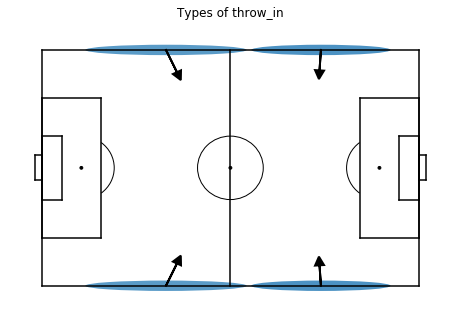

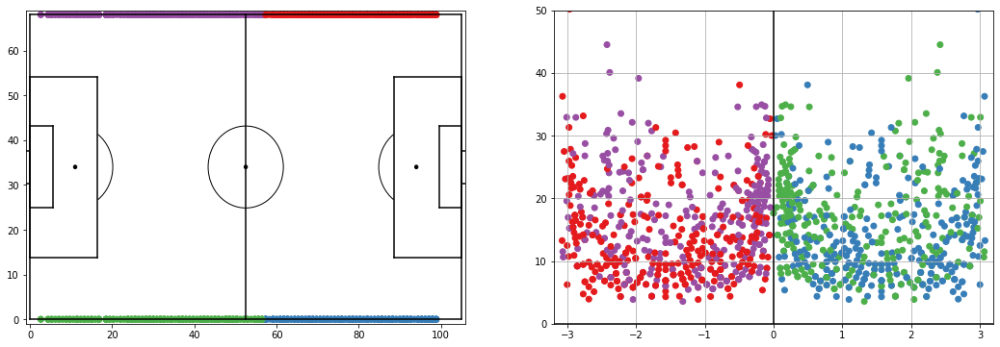

pass 19


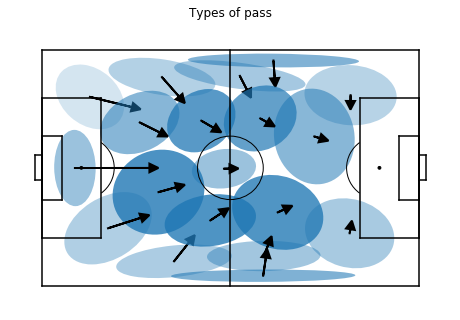

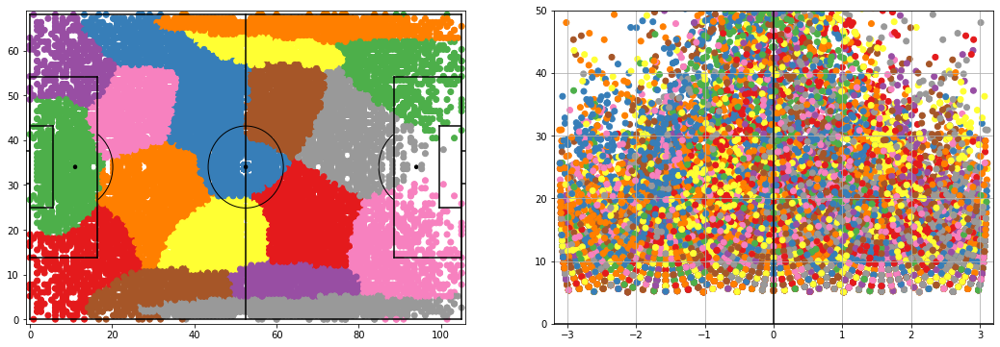

freekick 3


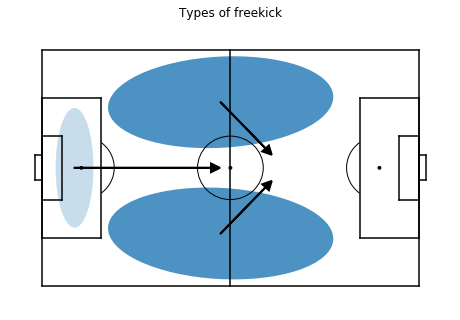

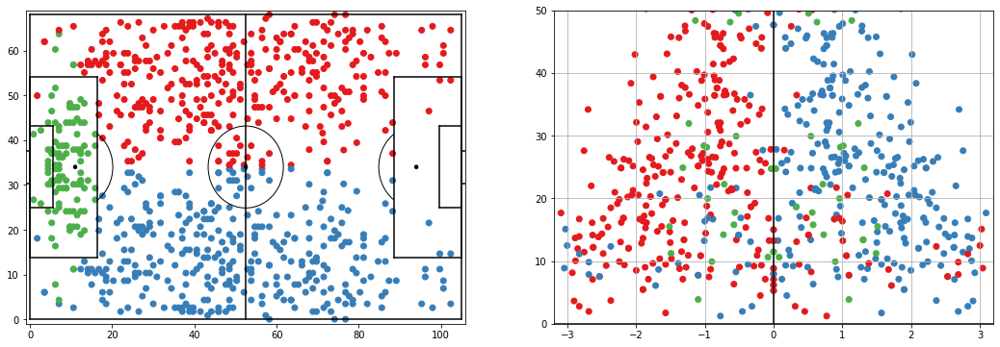

out 6


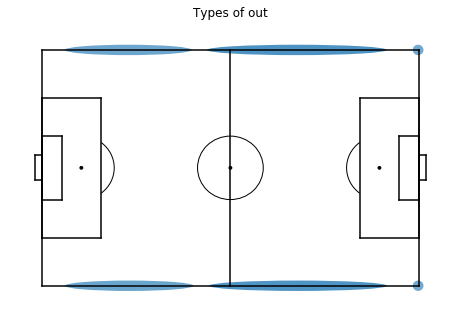

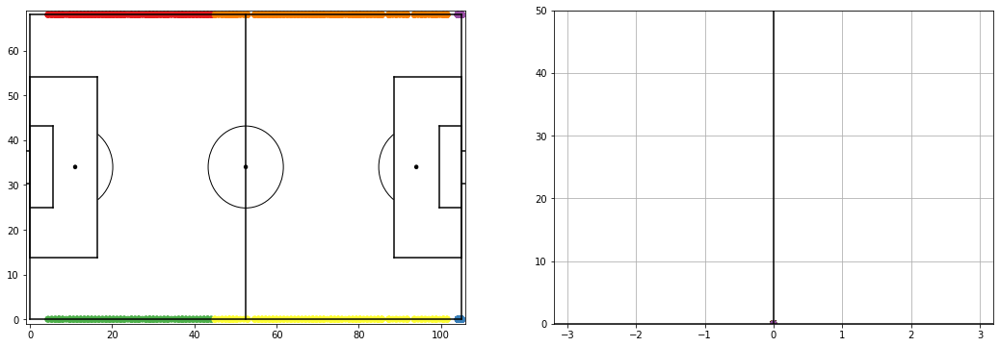

goal 1


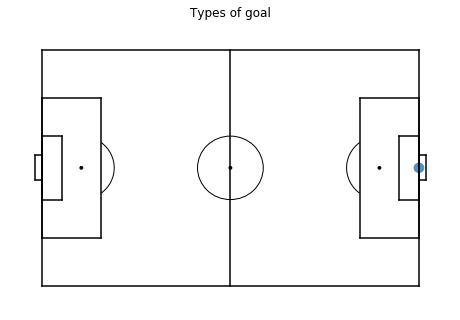

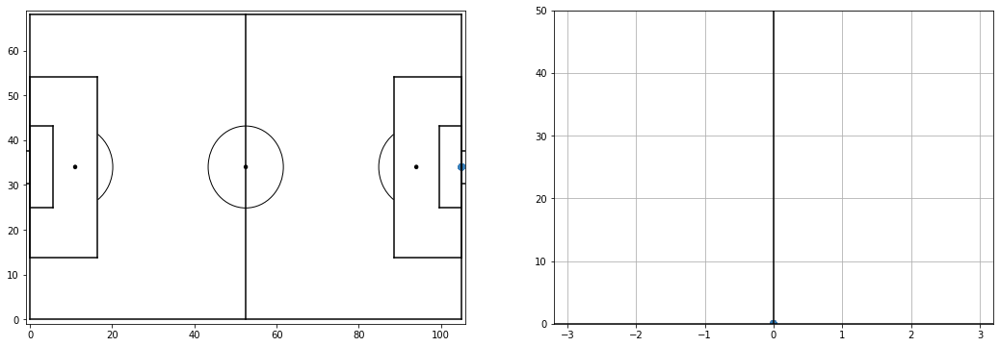

interception 9


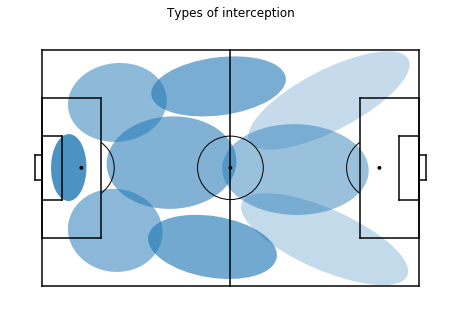

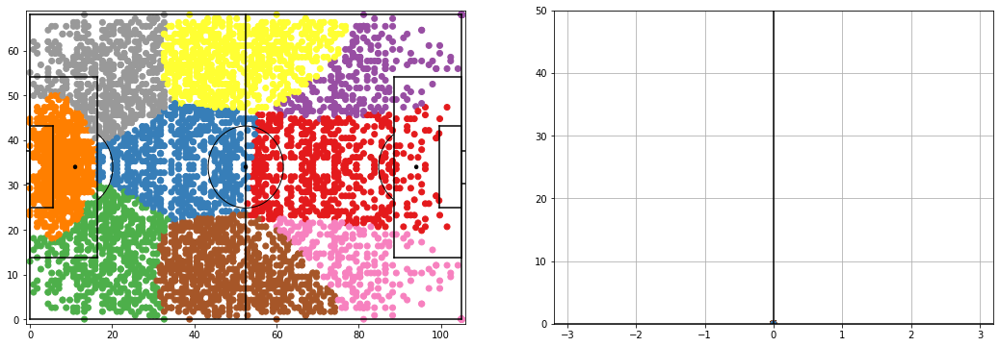

keeper_catch 2


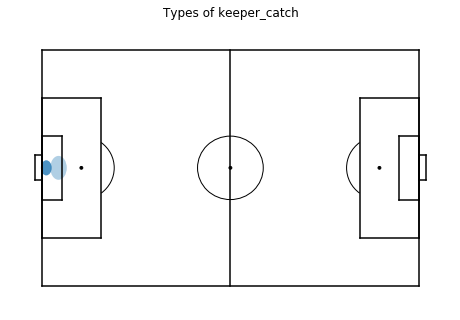

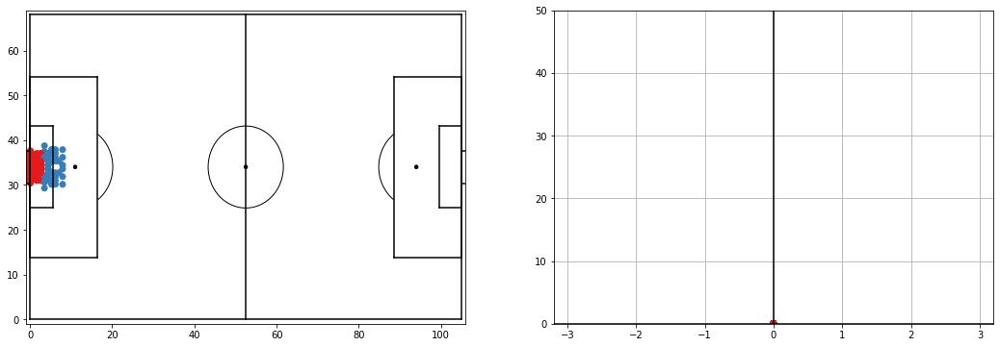

shot 3


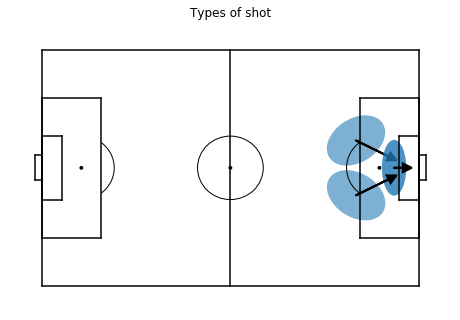

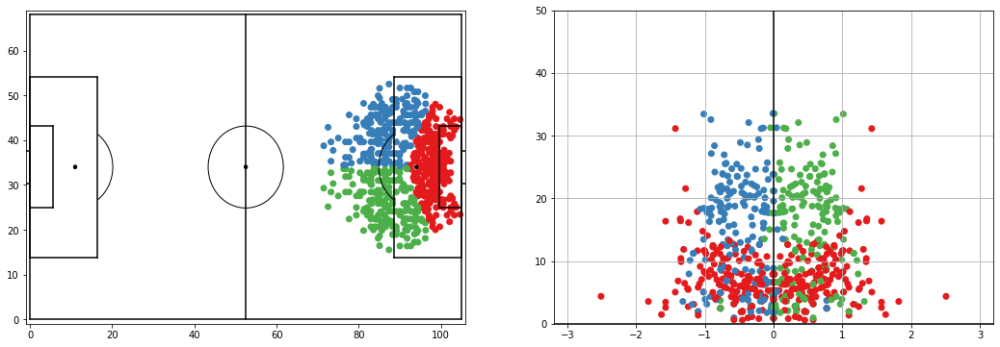

take_on 8


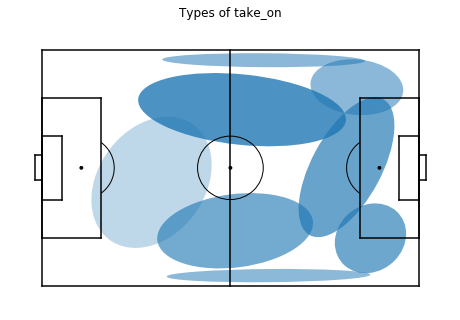

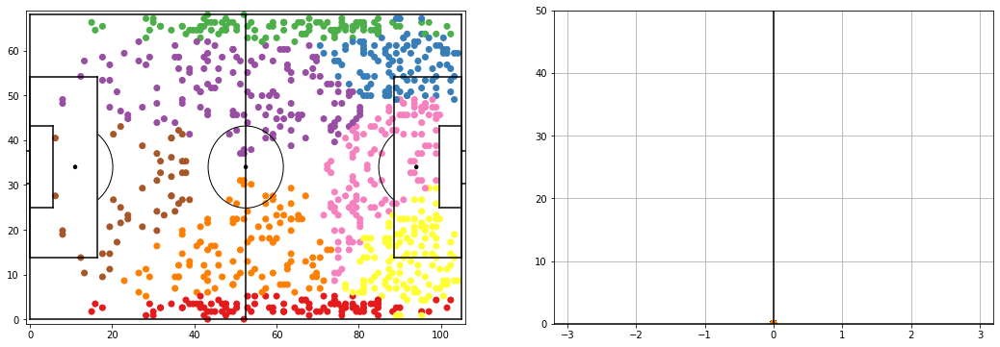

foul 3


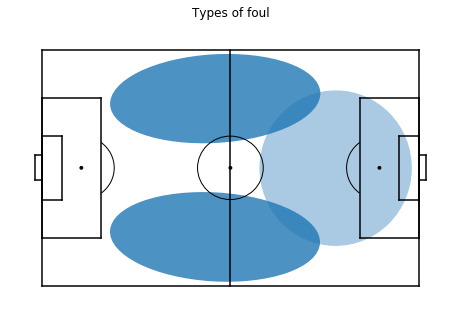

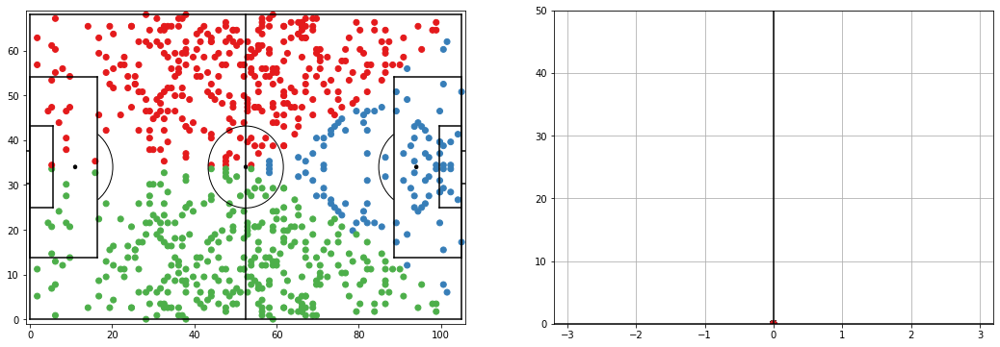

clearance 2


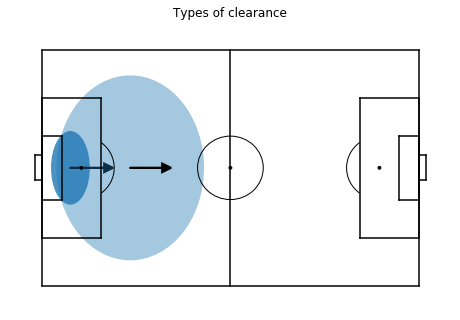

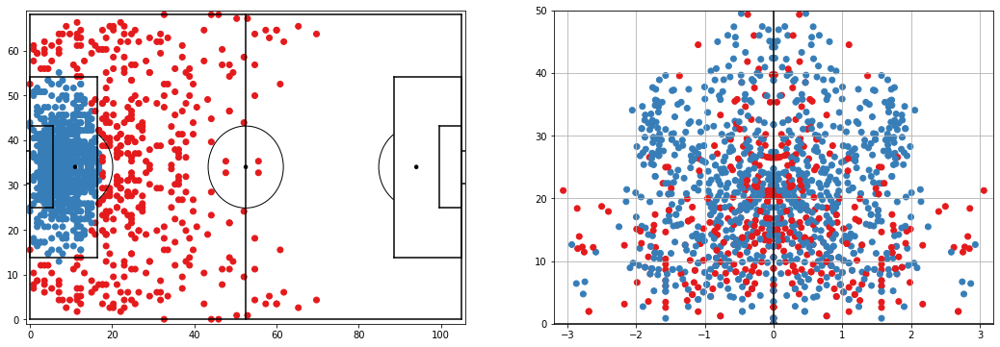

goalkick 2


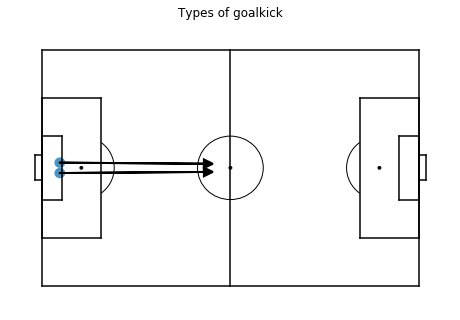

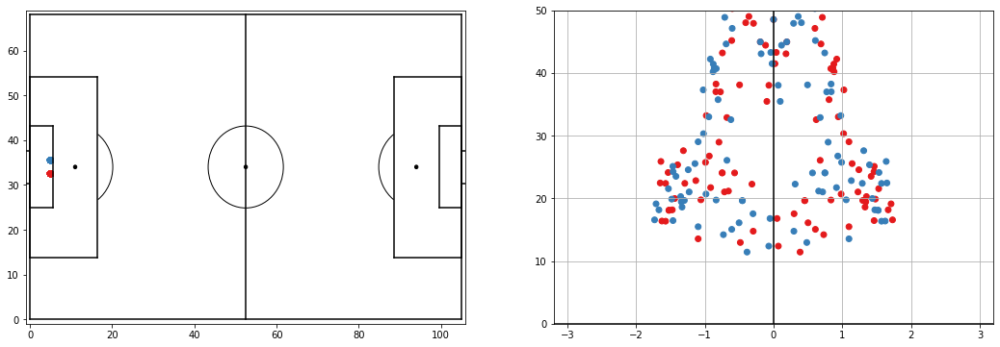

cross 4


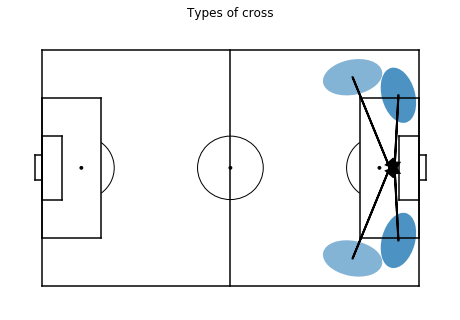

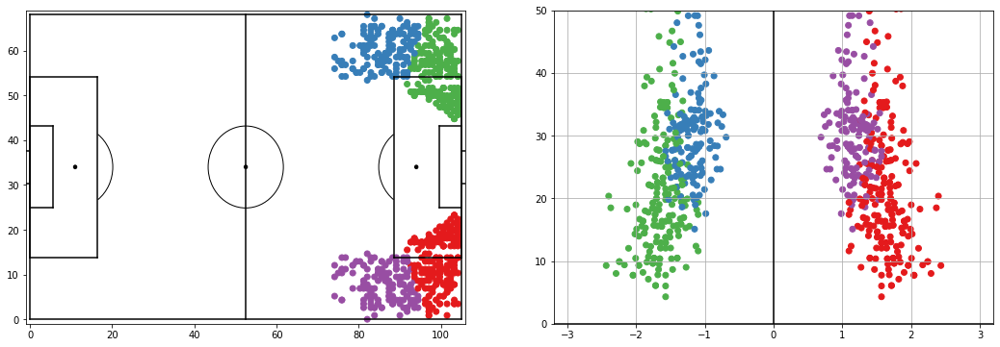

tackle 6


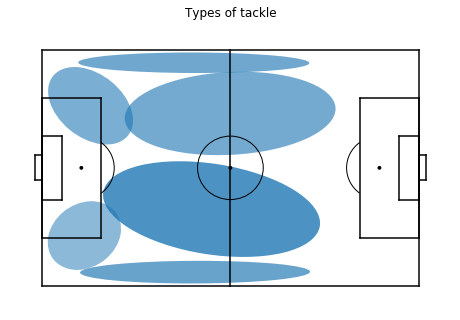

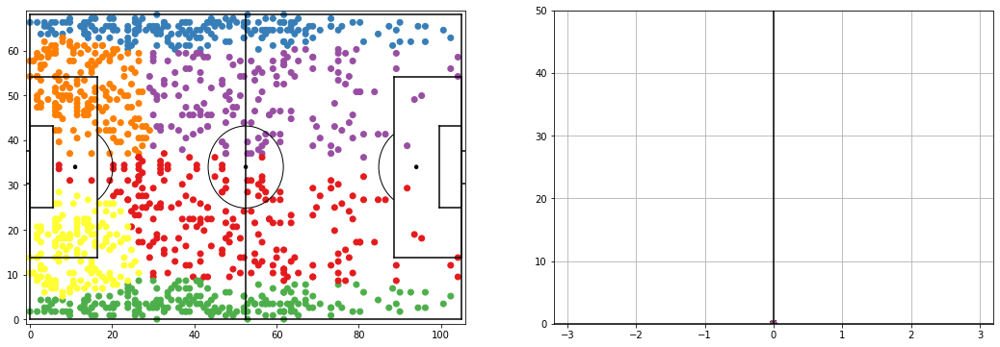

corner 2


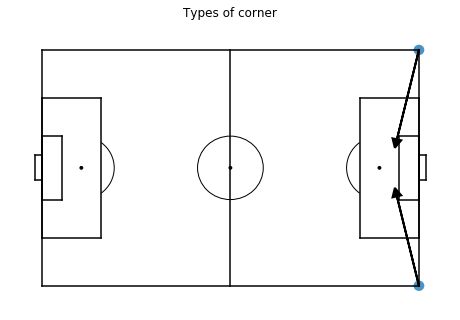

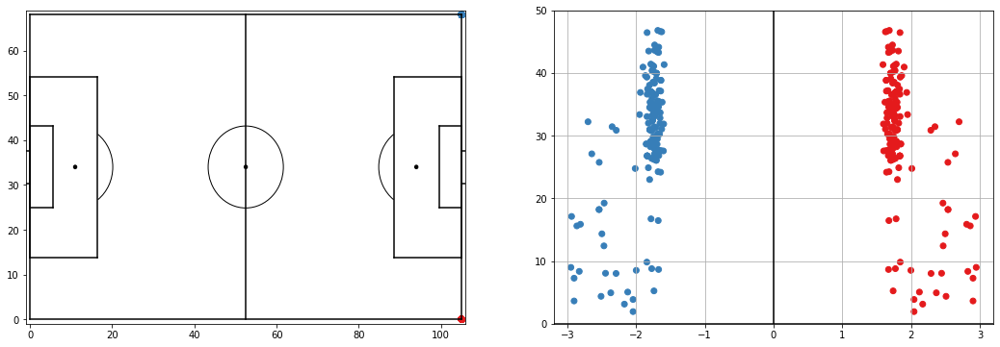

yellow_card 1


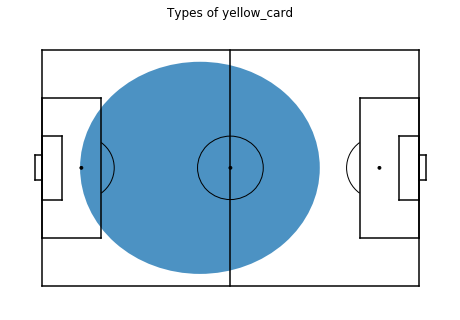

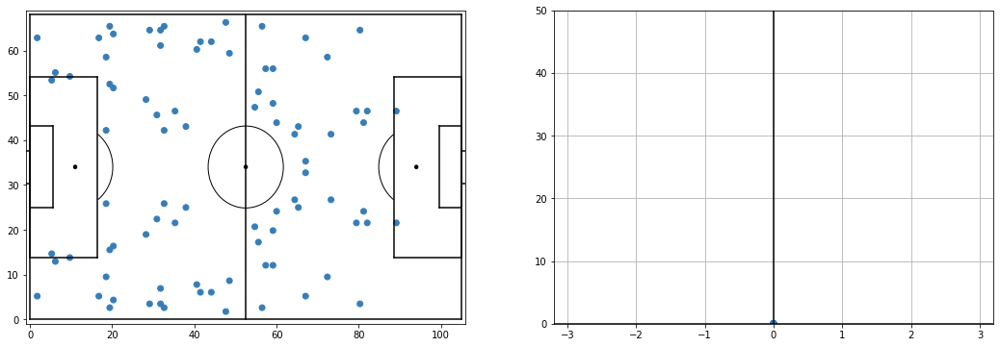

bad_touch 4


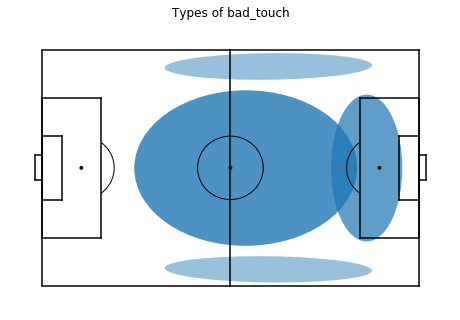

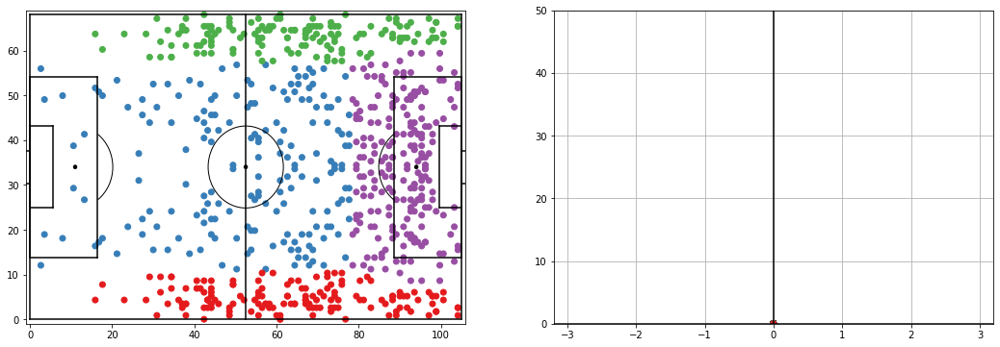

dribble 13


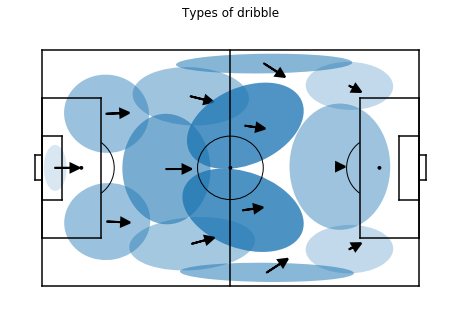

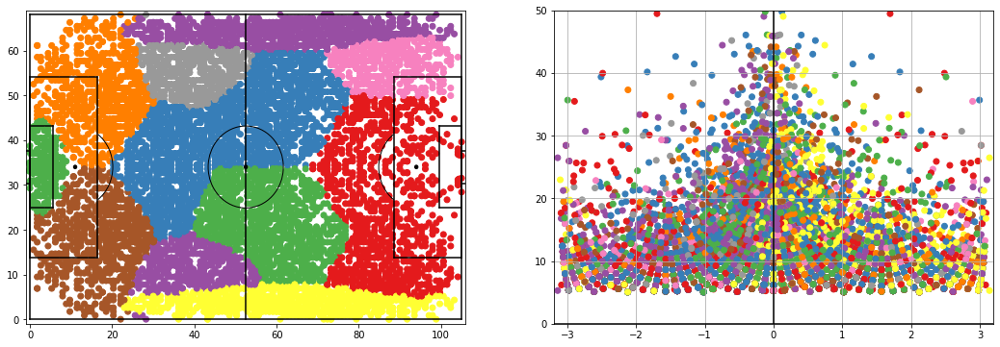

receival 15


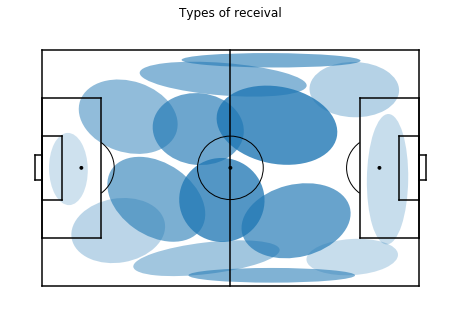

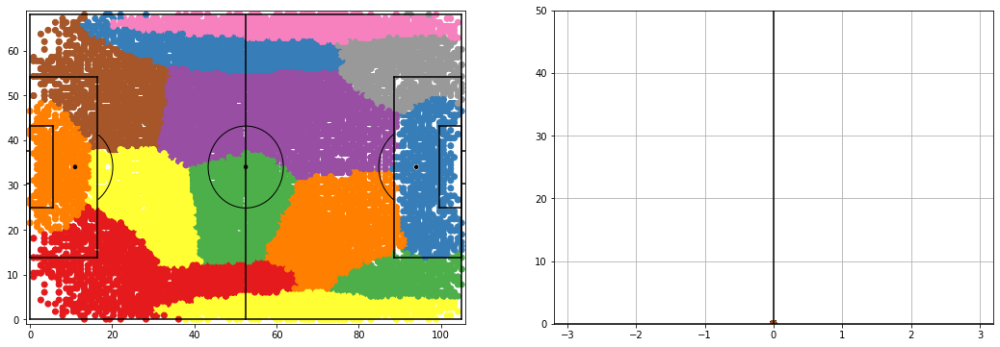

offside 1


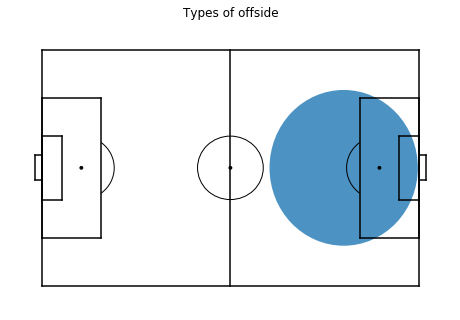

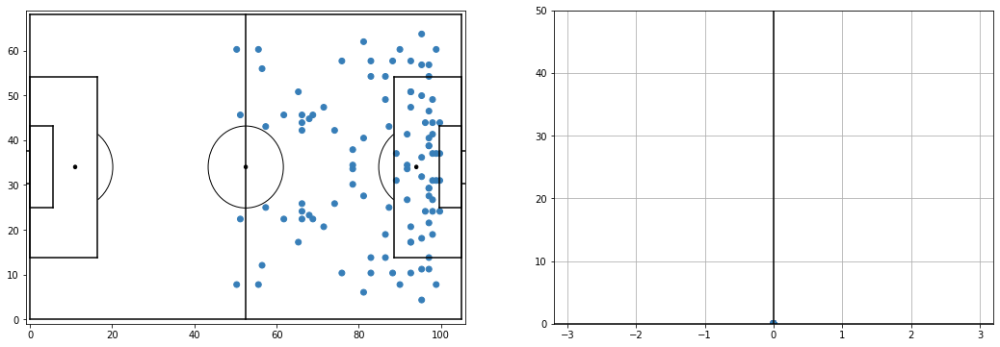

In [16]:
import warnings
warnings.filterwarnings("ignore")

colors = ["#377eb8",
    "#e41a1c",
    "#4daf4a",
    "#984ea3",
    "#ff7f00",
    "#ffff33",
    "#a65628",
    "#f781bf",
    "#999999",
    ]

def scattercolors(actions,weights,samplefn="max"):
    pos_weights_idx = weights.values.sum(axis=1) > 1e-1
    a = actions[pos_weights_idx]
    weights = weights[pos_weights_idx]

    if samplefn == "max":
        labels = np.argmax(weights.values,axis=1)
    else:
        labels = np.apply_along_axis(sample,axis=1, arr=weights.values)

    pcolors = [colors[l % len(colors)] for l in labels]
    return a,pcolors


for m_i in models_i:
    ax = mps.field(show=False,figsize=8)
    print(m_i.name,m_i.n_components)
    strengths_i = m_i.weights_ / np.max(m_i.weights_) * 0.8
    for i,(mean,covar,strength_i) in enumerate(zip(m_i.means_, m_i.covariances_,strengths_i)):
        #print(mean,covar)
        vis.add_ellips(ax,mean[:2],covar[:2,:2],alpha=strength_i)
        #vis.add_ellips(ax,mean[:2],[[covar[0],0],[0,covar[1]]],alpha=strength_i)
        x,y = mean[:2]
        we = w_i[f"{m_i.name}_{i}"].values
        dx = np.average(m_i.df["dx"].values,weights=we)
        dy = np.average(m_i.df["dy"].values,weights=we)
        d = 1
        strength_ii=1
        vis.add_arrow(ax,x,y,d*dx,d*dy,
                                  alpha=strength_ii,
                                  linewidth=2*strength_ii,
                                  arrowsize=2.5*strength_ii,
                                  #linewidth=2,
                                  threshold=1)
    plt.title(f"Types of {m_i.name}")
    plt.show()
    
    columns = list(f"{m_i.name}_{i}" for i in range(m_i.n_components))
    acol,c = scattercolors(a,w_i[columns])
    
    axs = vis.axesxypolar()
    axs[0].scatter(acol.x,acol.y,c=c)
    axs[1].scatter(acol.mov_angle_a0,acol.mov_d_a0,c=c)
    #axs[1].scatter(dfc.x + dfc.dx,dfc.y + dfc.dy,c=dfc.membership,cmap="Blues")
    #axs[1].scatter(dfc.mov_angle_a0,dfc.mov_d_a0,c=dfc.membership,cmap="Blues")
    plt.show()

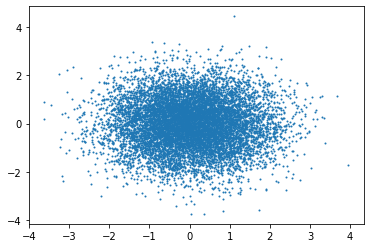

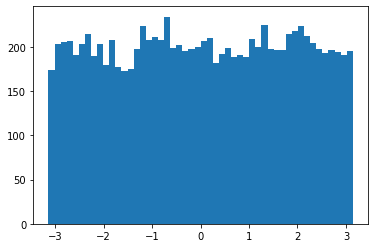

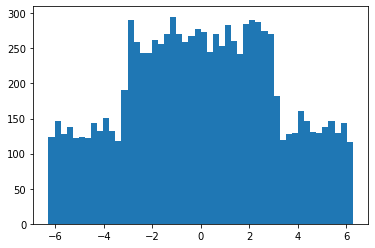

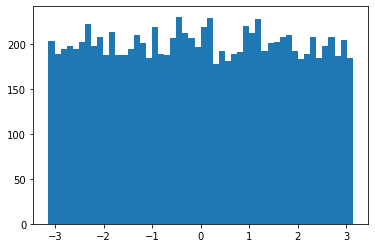

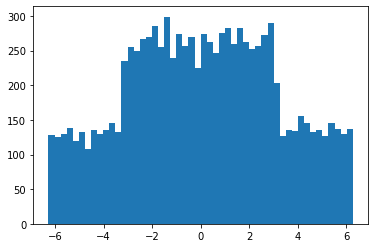

In [91]:
import numpy as np
import math
import matplotlib.pyplot as plt

def polar(x,y):
    w = np.arctan2(y,x)
    r = np.sqrt(x ** 2 + y ** 2)
    return w,r

def ipolar(w,r):
    return r * np.sin(w), r * np.cos(w)

#w,r = polar(5,4)
x = np.random.normal(0,1,10000)
y = np.random.normal(0,1,10000)
#x = np.random.uniform(-1,1,10000)
#y = np.random.uniform(-1,1,10000)
plt.scatter(x,y,s=1)
plt.show()

w,r = polar(x,y)
plt.hist(w,bins=50)
plt.show()
w += np.random.randint(-1,2,10000) * np.pi
plt.hist(w,bins=50)
plt.show()

w = np.random.uniform(-np.pi,np.pi,10000)
plt.hist(w,bins=50)
plt.show()
w += np.random.randint(-1,2,10000) * np.pi
plt.hist(w,bins=50)
plt.show()

#r = np.sqrt(r)
#plt.scatter(w,r,s=1)
#plt.show()

# # #w = np.random.normal(-np.pi,np.pi,10000)
# w = np.random.normal(-np.pi,0.1,10000)
# # #r = np.sqrt(np.random.uniform(0,1,10000))
# # r = np.random.uniform(0,1,10000)
# r = [1] * len(w)
# plt.scatter(w,r,s=1)
# plt.show()
# plt.hist(w,bins=50)
# plt.show()

# x,y = ipolar(w,r)
# plt.scatter(x,y,s=1)
# plt.show()

# w += np.random.normal(0,0.1,10000)
# r = [1] * len(w)
# plt.scatter(w,r,s=1)
# plt.show()
# x,y = ipolar(w,r)
# plt.scatter(x,y,s=1)
# plt.show()

In [75]:
set(np.random.randint(-1,2,len(w)))

{-1, 0, 1}

pass_0 25531 3469.2761817992514


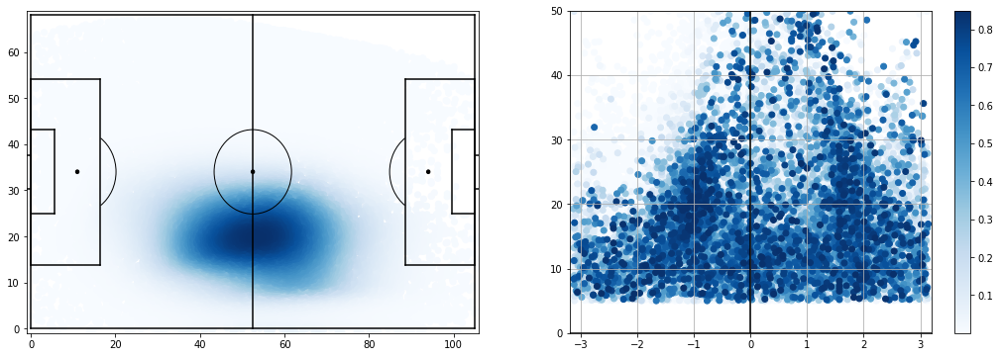

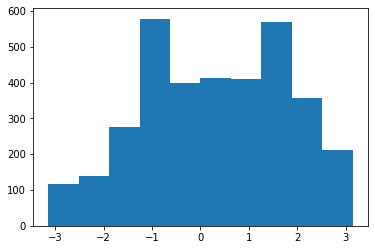

pass_1 25916 1795.3320023160168


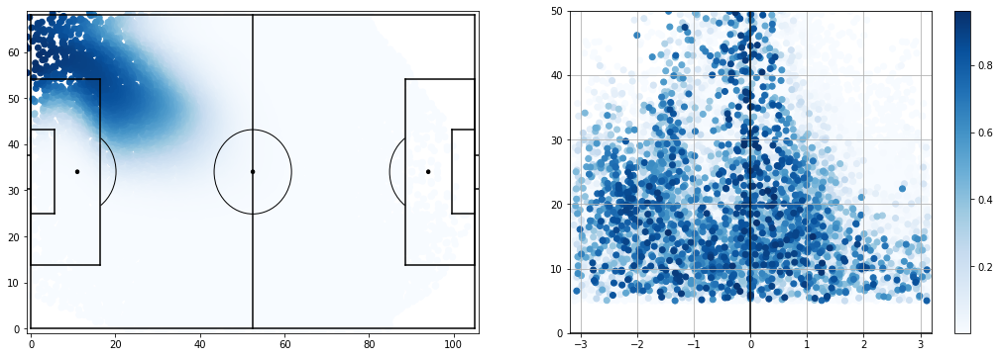

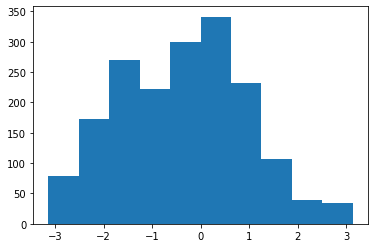

pass_2 20943 1650.8903233321284


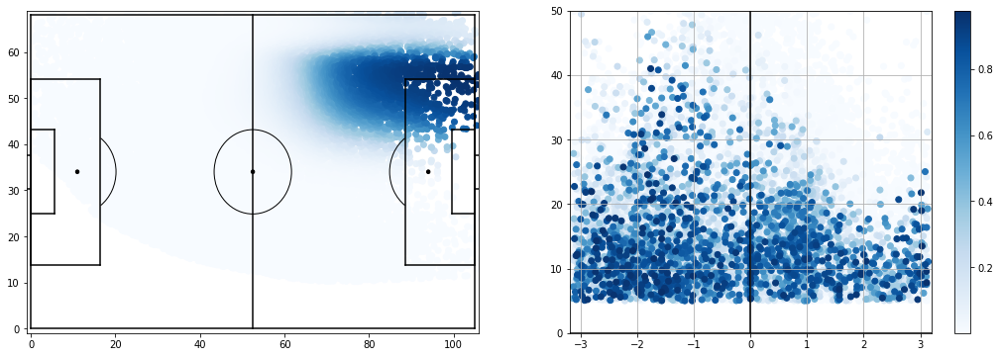

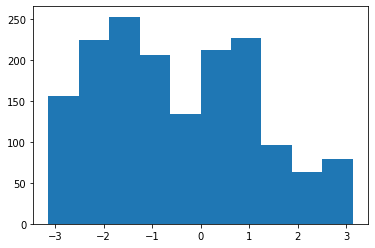

pass_3 14212 1622.2665634002426


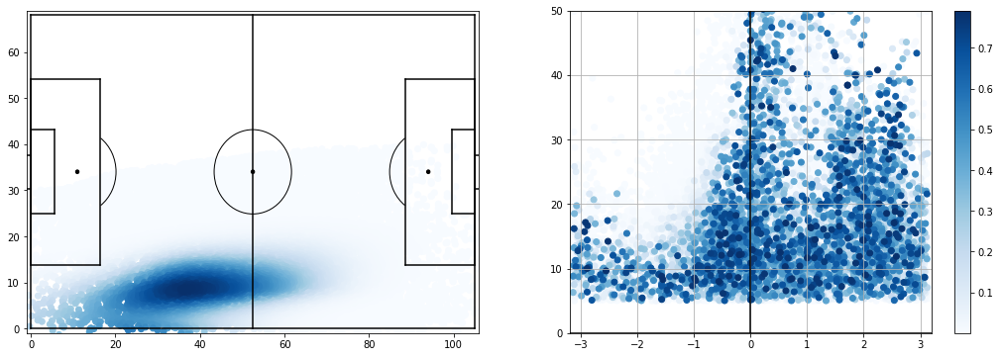

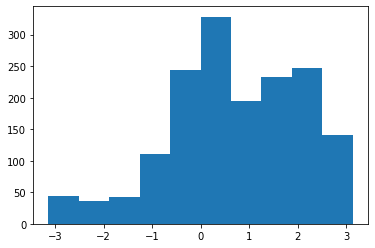

pass_4 18122 1947.4509427753958


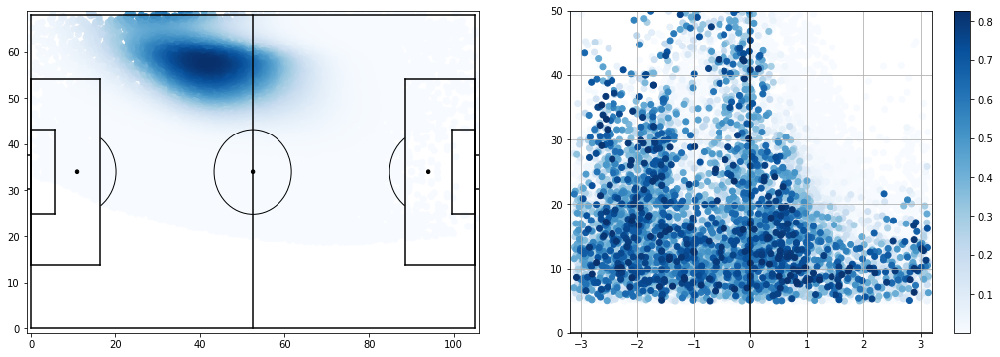

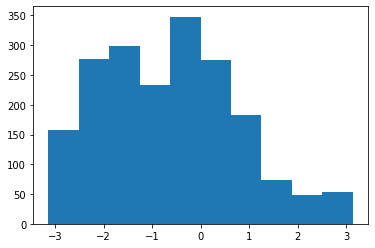

pass_5 7154 2139.4990132553826


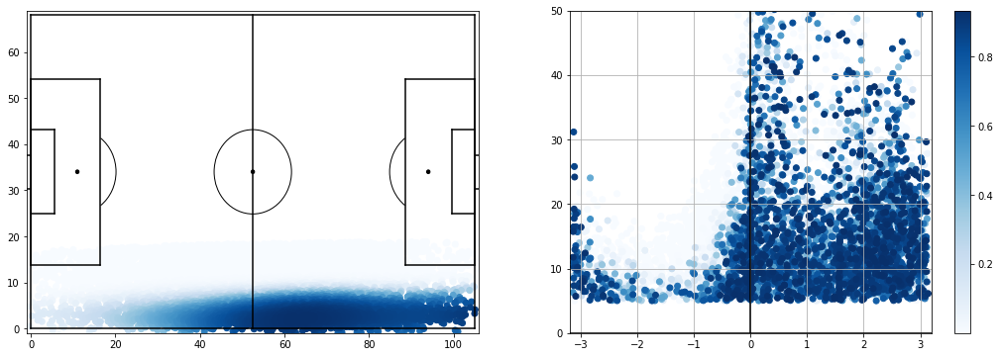

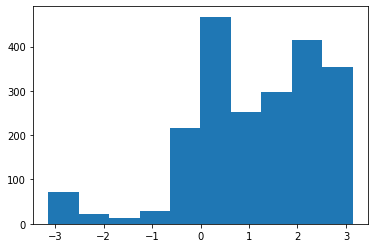

pass_6 7113 1234.2299936869088


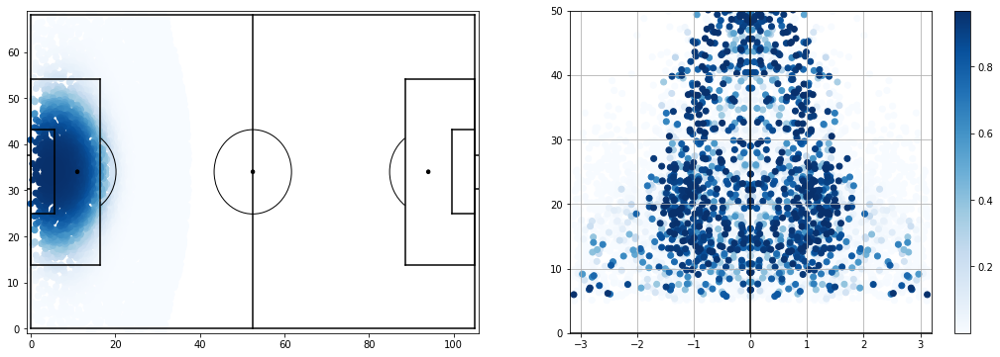

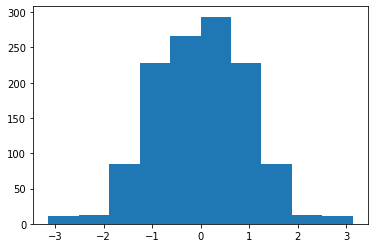

pass_7 26742 3663.0841902365732


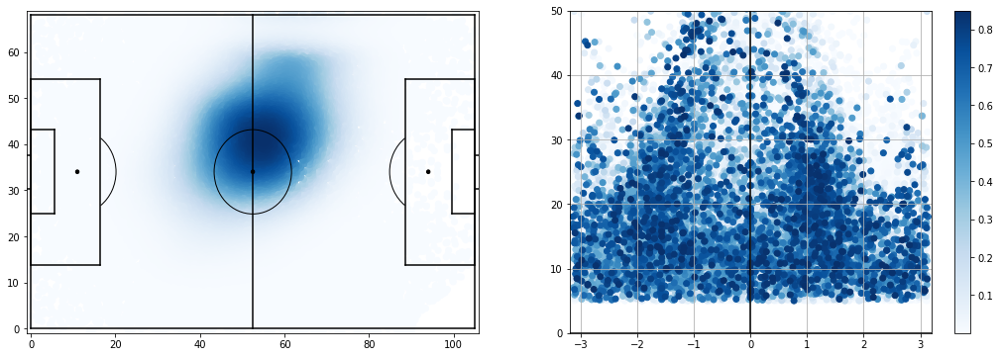

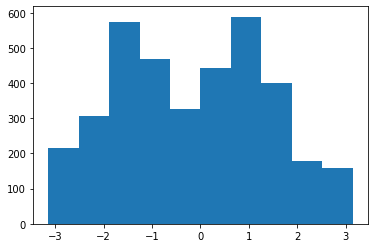

pass_8 18938 1299.2303007726898


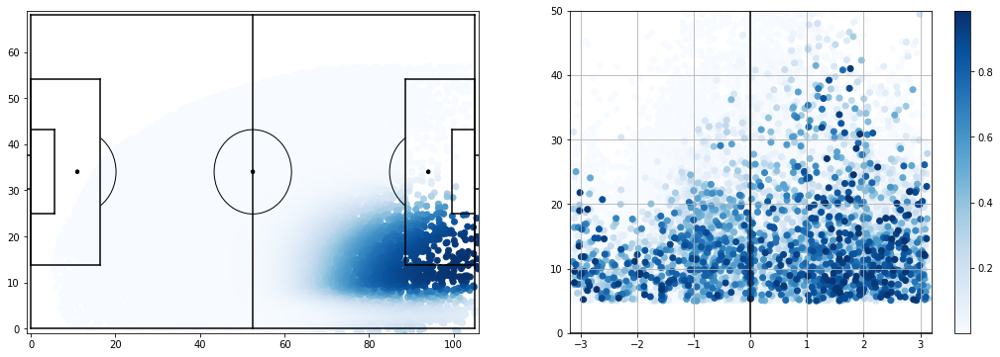

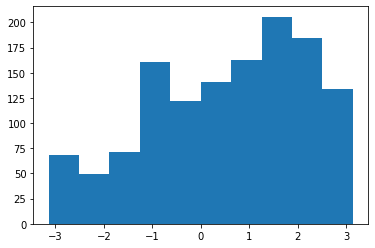

pass_9 24780 1507.1151091583238


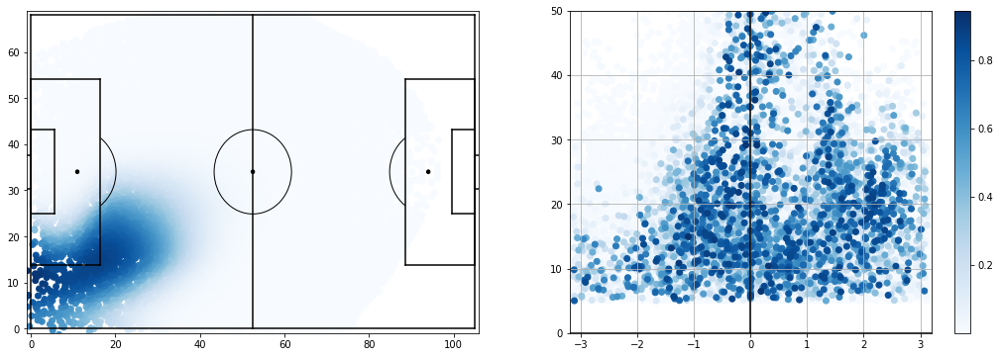

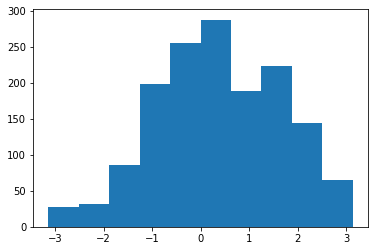

pass_10 26845 2371.620458029635


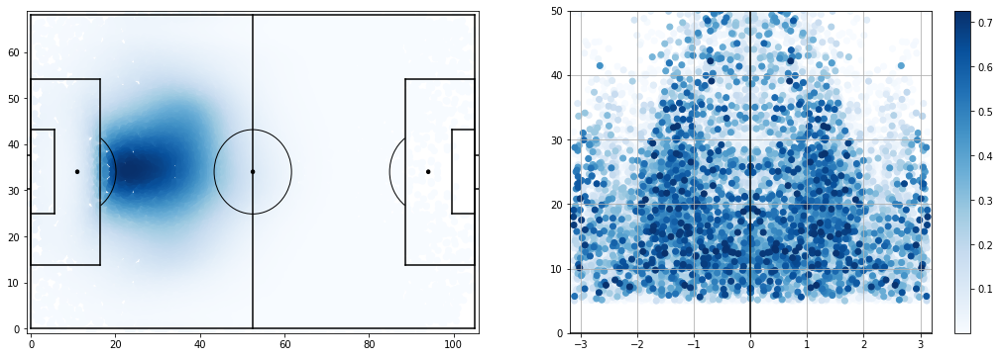

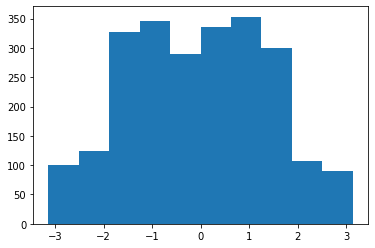

pass_11 26688 1870.059084441077


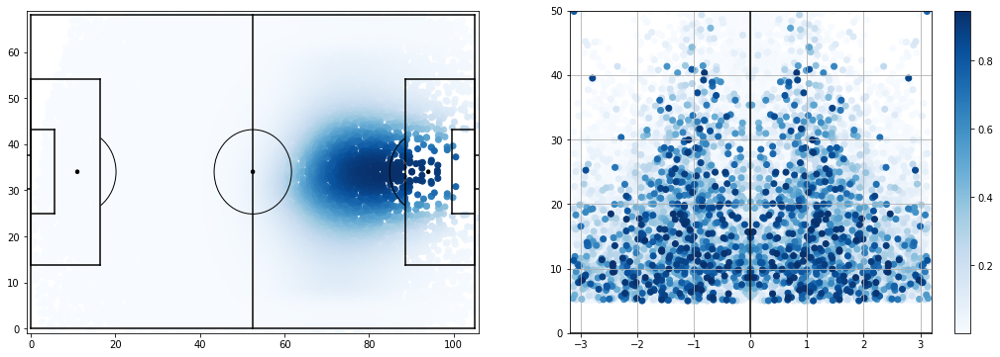

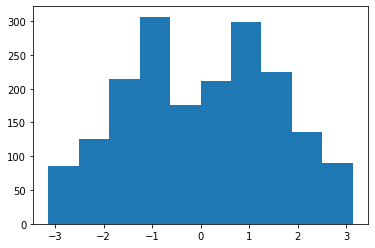

pass_12 8178 2289.945836796269


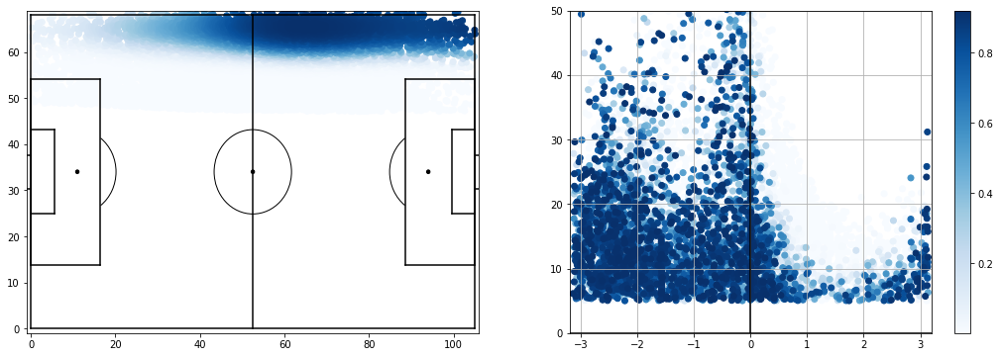

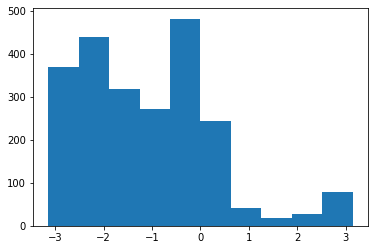

In [21]:
for column in w_i.columns:
    if "pass" in column:
        probs = w_i[column]
        pos_prob_idx = probs > 1e-10
        print(column,sum(pos_prob_idx),sum(probs))
        dfc = a.reset_index()[pos_prob_idx].copy()
        dfc["membership"] = probs[pos_prob_idx]
        dfc = dfc.sort_values("membership",ascending=True)

        axs = vis.axesxypolar()
        sc = axs[0].scatter(dfc.x,dfc.y,c=dfc.membership,cmap="Blues")
        plt.colorbar(sc)
        #axs[1].scatter(dfc.x + dfc.dx,dfc.y + dfc.dy,c=dfc.membership,cmap="Blues")
        axs[1].scatter(dfc.mov_angle_a0,dfc.mov_d_a0,c=dfc.membership,cmap="Blues")
        plt.show()
        plt.hist(dfc.mov_angle_a0,weights=dfc.membership)
        plt.show()

In [92]:
cols_ii = [#"x","y",
        #"dx","dy"
        #"dist_to_goal_a0",
        #"angle_to_goal_a0",
        #"mov_d_a0",
        "mov_angle_a0"
        "dx_a0",
        "dy_a0"
       ]

w_i = probabilities(models_i)
# print(w_i.sum())
# for w_i_col in w_i.columns:
#     new_w = w_i[w_i_col] * a.mov_d_a0.values
#     if new_w.sum() > 1e-5:
#         w_i[w_i_col] = new_w
# print(w_i.sum())
experiments = {name : range(1,11) for name in w_i.columns}

In [93]:
experiments

{'throw_in_0': range(1, 11),
 'throw_in_1': range(1, 11),
 'throw_in_2': range(1, 11),
 'throw_in_3': range(1, 11),
 'pass_0': range(1, 11),
 'pass_1': range(1, 11),
 'pass_2': range(1, 11),
 'pass_3': range(1, 11),
 'pass_4': range(1, 11),
 'pass_5': range(1, 11),
 'pass_6': range(1, 11),
 'pass_7': range(1, 11),
 'pass_8': range(1, 11),
 'pass_9': range(1, 11),
 'pass_10': range(1, 11),
 'pass_11': range(1, 11),
 'pass_12': range(1, 11),
 'pass_13': range(1, 11),
 'pass_14': range(1, 11),
 'pass_15': range(1, 11),
 'pass_16': range(1, 11),
 'pass_17': range(1, 11),
 'pass_18': range(1, 11),
 'freekick_0': range(1, 11),
 'freekick_1': range(1, 11),
 'freekick_2': range(1, 11),
 'out_0': range(1, 11),
 'out_1': range(1, 11),
 'out_2': range(1, 11),
 'out_3': range(1, 11),
 'out_4': range(1, 11),
 'out_5': range(1, 11),
 'goal_0': range(1, 11),
 'interception_0': range(1, 11),
 'interception_1': range(1, 11),
 'interception_2': range(1, 11),
 'interception_3': range(1, 11),
 'intercepti

In [94]:
with Client("glados:8786") as client:
    client.run(lambda: print("hello world"))
    a_fut = client.scatter(a, broadcast=True)
    w_i_fut = client.scatter(w_i, broadcast=True)
    futures = []
    for name in experiments:
        for i in experiments[name]:
            future = client.submit(learn_wgmm,a_fut,cols_ii,w_i_fut,name,i,key=f"{name}_{i}")
            futures.append(future)
    can_ii = client.gather(futures)

KeyError: "['mov_angle_a0dx_a0'] not in index"

In [25]:
for model in can_ii:
    model.weights = w_i[model.name].values
    model.df = a
    model.columns = cols_ii

In [26]:
models_all_ii = pat.ilp_select_models_bic(can_ii,verbose=True)
models_all_ = {m.name : m.n_components for m in models_all_ii}
models_solo_ii = pat.select_models_solo_bic(can_ii)
models_solo_ = {m.name : m.n_components for m in models_solo_ii}
list((m.name,models_all_[m.name], models_solo_[m.name]) for m in models_all_ii)

Iter	Lower Bound	Upper Bound	Gap

ECOS 2.0.7 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  -2.914e+05  -6.604e+05  +4e+05  7e-03  3e-10  1e+00  2e+02    ---    ---    1  1  - |  -  - 
 1  -2.952e+05  -3.546e+05  +6e+04  1e-03  5e-11  1e+01  3e+01  0.9048  8e-02   0  1  1 |  0  0
 2  -3.010e+05  -3.158e+05  +2e+04  3e-04  1e-11  7e+00  7e+00  0.9890  2e-01   0  1  1 |  0  0
 3  -3.033e+05  -3.068e+05  +4e+03  6e-05  3e-12  2e+00  2e+00  0.8390  9e-02   0  1  1 |  0  0
 4  -3.045e+05  -3.052e+05  +8e+02  1e-05  1e-12  4e-01  4e-01  0.9883  2e-01   0  1  1 |  0  0
 5  -3.047e+05  -3.048e+05  +1e+02  1e-06  2e-13  5e-02  5e-02  0.9057  3e-02   0  1  1 |  0  0
 6  -3.048e+05  -3.048e+05  +1e+01  2e-07  1e-13  7e-03  7e-03  0.8626  1e-02   0  1  1 |  0  0
 7  -3.048e+05  -3.048e+05  +3e-01  4e-09  5e-14  1e-04  1e-04  0.9879  7e-03   0  1  1 |  0  0
 8  -3.048e+0

[('out_0', 1, 1),
 ('out_1', 1, 1),
 ('out_2', 1, 1),
 ('out_3', 1, 1),
 ('out_4', 1, 1),
 ('out_5', 1, 1),
 ('keeper_catch_0', 1, 1),
 ('throw_in_0', 3, 3),
 ('throw_in_1', 2, 4),
 ('throw_in_2', 2, 4),
 ('throw_in_3', 3, 3),
 ('cross_0', 1, 1),
 ('cross_1', 1, 1),
 ('cross_2', 1, 1),
 ('cross_3', 1, 1),
 ('goal_0', 1, 1),
 ('offside_0', 1, 1),
 ('foul_0', 1, 1),
 ('foul_1', 1, 1),
 ('foul_2', 1, 1),
 ('freekick_0', 1, 3),
 ('freekick_1', 1, 3),
 ('freekick_2', 1, 1),
 ('shot_0', 1, 1),
 ('shot_1', 1, 1),
 ('shot_2', 1, 1),
 ('goalkick_0', 1, 5),
 ('interception_0', 1, 1),
 ('interception_1', 1, 1),
 ('interception_2', 1, 1),
 ('interception_3', 1, 1),
 ('interception_4', 1, 1),
 ('interception_5', 1, 1),
 ('interception_6', 1, 1),
 ('interception_7', 1, 1),
 ('interception_8', 1, 1),
 ('dribble_0', 4, 4),
 ('dribble_1', 1, 3),
 ('dribble_2', 10, 10),
 ('dribble_3', 1, 1),
 ('dribble_4', 1, 1),
 ('dribble_5', 1, 1),
 ('dribble_6', 3, 4),
 ('dribble_7', 3, 5),
 ('dribble_8', 4, 5),
 ('

In [27]:
models_ii = models_all_ii
w_ii = probabilities(models_ii)

out
out_0 1
out_1 1
out_2 1
out_3 1
out_4 1
out_5 1


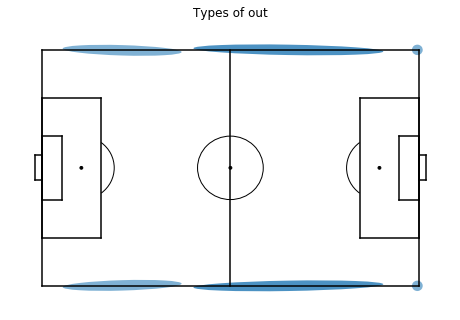

keeper_catch
keeper_catch_0 1


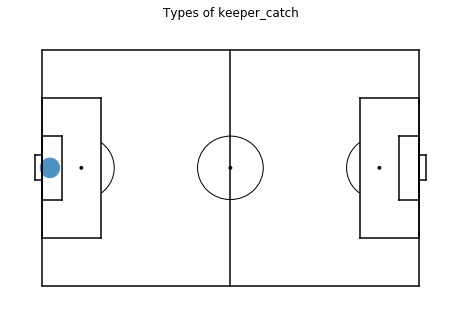

throw_in
throw_in_0 3
throw_in_1 2
throw_in_2 2
throw_in_3 3


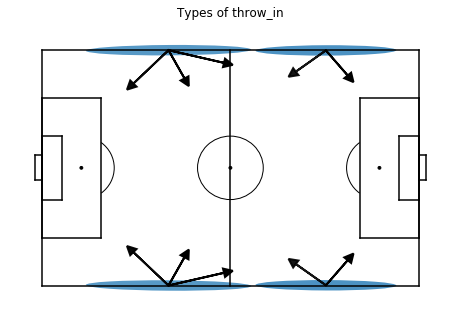

cross
cross_0 1
cross_1 1
cross_2 1
cross_3 1


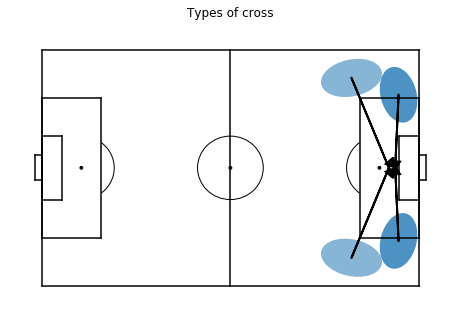

goal
goal_0 1


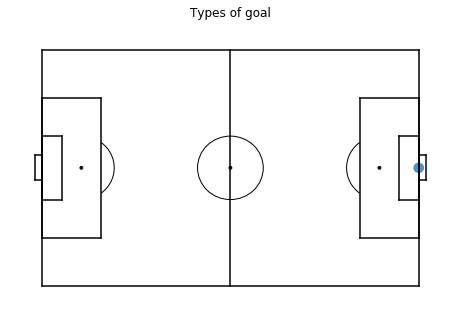

offside
offside_0 1


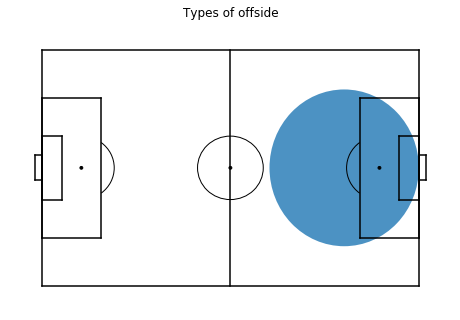

foul
foul_0 1
foul_1 1
foul_2 1


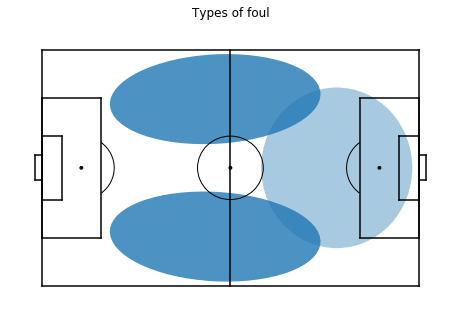

freekick
freekick_0 1
freekick_1 1
freekick_2 1


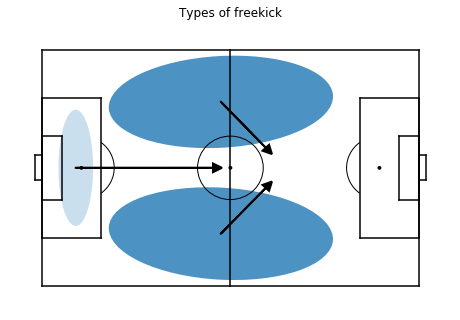

shot
shot_0 1
shot_1 1
shot_2 1


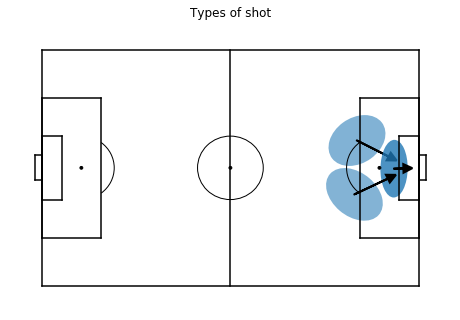

goalkick
goalkick_0 1


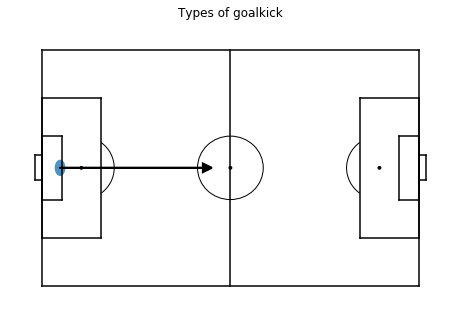

interception
interception_0 1
interception_1 1
interception_2 1
interception_3 1
interception_4 1
interception_5 1
interception_6 1
interception_7 1
interception_8 1


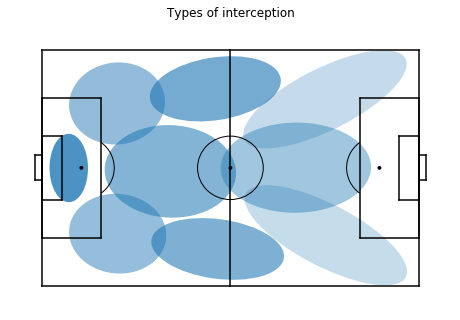

dribble
dribble_0 4
dribble_1 1
dribble_2 10
dribble_3 1
dribble_4 1
dribble_5 1
dribble_6 3
dribble_7 3
dribble_8 4
dribble_9 3
dribble_10 1
dribble_11 2
dribble_12 1
dribble_13 1
dribble_14 3
dribble_15 1
dribble_16 1


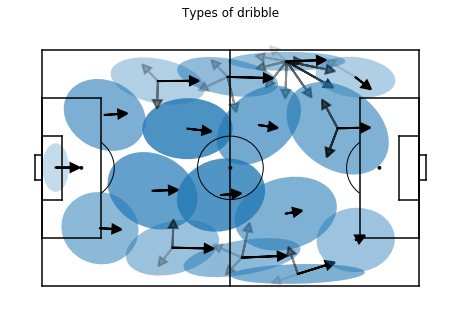

pass
pass_0 6
pass_1 3
pass_2 4
pass_3 3
pass_4 3
pass_5 7
pass_6 1
pass_7 6
pass_8 4
pass_9 3
pass_10 2
pass_11 2
pass_12 7


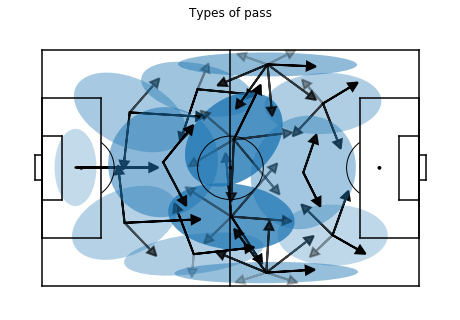

receival
receival_0 1
receival_1 1
receival_2 1
receival_3 1
receival_4 1
receival_5 1
receival_6 1
receival_7 1
receival_8 1
receival_9 1
receival_10 1
receival_11 1
receival_12 1
receival_13 1
receival_14 1
receival_15 1
receival_16 1
receival_17 1


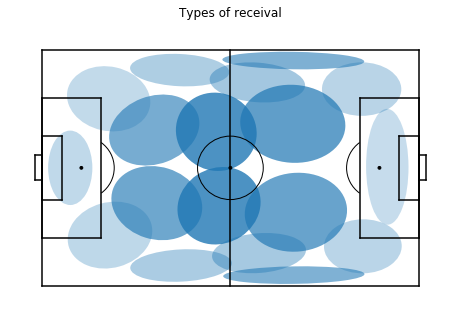

corner
corner_0 2
corner_1 2


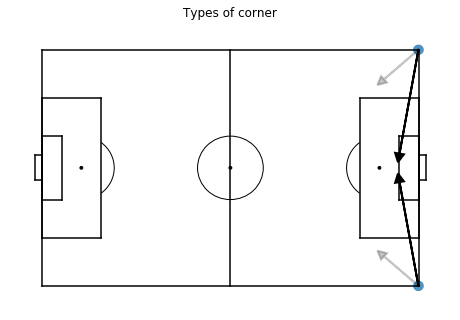

yellow_card
yellow_card_0 1


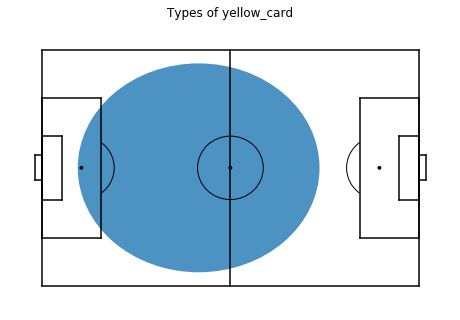

bad_touch
bad_touch_0 1
bad_touch_1 1
bad_touch_2 1
bad_touch_3 1


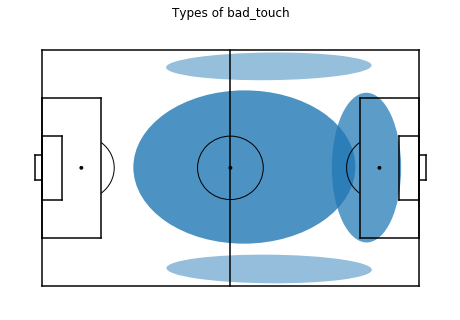

tackle
tackle_0 1
tackle_1 1
tackle_2 1
tackle_3 1
tackle_4 1


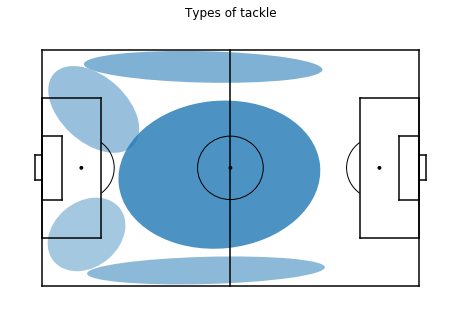

clearance
clearance_0 1
clearance_1 1
clearance_2 1
clearance_3 1


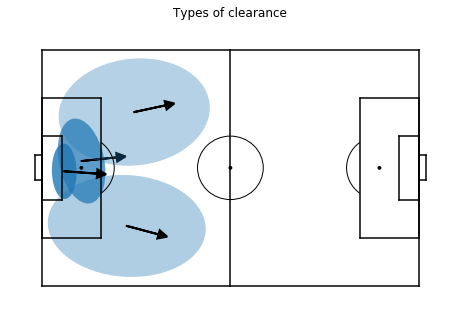

take_on
take_on_0 1
take_on_1 1
take_on_2 1
take_on_3 1


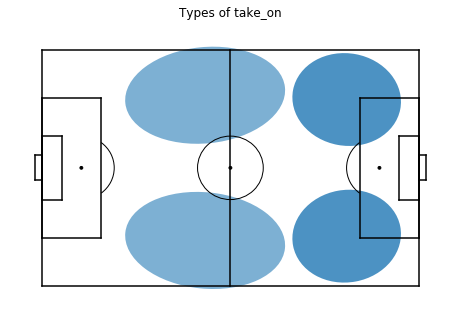

In [28]:


import math
for m_i in models_i:
    ax = mps.field(show=False,figsize=8)
    print(m_i.name)
    strengths_i = m_i.weights_ / np.max(m_i.weights_) * 0.8
    for i,(mean,covar,strength_i) in enumerate(zip(m_i.means_, m_i.covariances_,strengths_i)):
        vis.add_ellips(ax,mean,covar[:2,:2],alpha=strength_i)
        #vis.add_ellips(ax,mean,[[covar[0],0],[0,covar[1]]],alpha=strength_i)
        x,y = mean[:2]
        for m_ii in models_ii:
            if f"{m_i.name}_{i}" == m_ii.name:
                print(m_ii.name,m_ii.n_components)
                strengths_ii = m_ii.weights_ / np.max(m_ii.weights_)
                for j in range(m_ii.n_components):
                    we = w_ii[f"{m_ii.name}_{j}"].values
                    #x = np.average(m_ii.df["x"].values,weights=we)
                    #y = np.average(m_ii.df["y"].values,weights=we)
                    dx = np.average(m_ii.df["dx"].values,weights=we)
                    dy = np.average(m_ii.df["dy"].values,weights=we)
                    #norm = math.sqrt(dx*dx+dy*dy)
                    #dx,dy = dx/norm,dy/norm
                    strength_ii = strengths_ii[j]
                    d=1
                    vis.add_arrow(ax,x,y,d*dx,d*dy,
                                  alpha=strength_ii,
                                  #linewidth=2*strength_ii,
                                  #arrowsize=2.5*strength_ii,
                                  #linewidth=2,
                                  threshold=0)
    plt.title(f"Types of {m_i.name}")
    plt.show()

pass_0 7794 3469.2761817992514
['pass_0_0', 'pass_0_1', 'pass_0_2', 'pass_0_3', 'pass_0_4', 'pass_0_5']


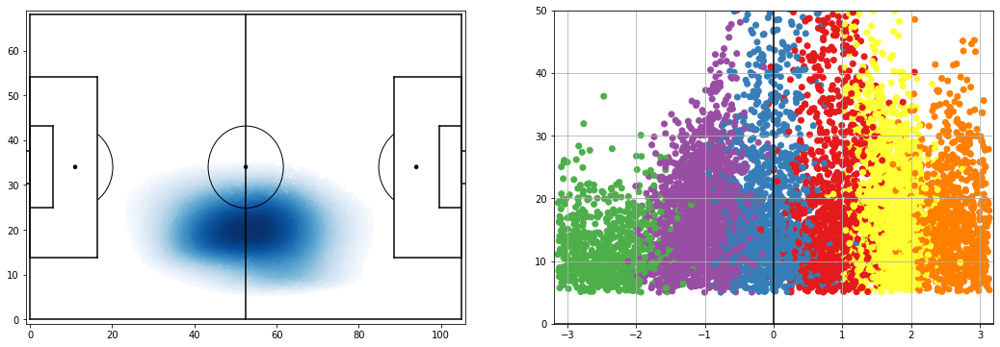

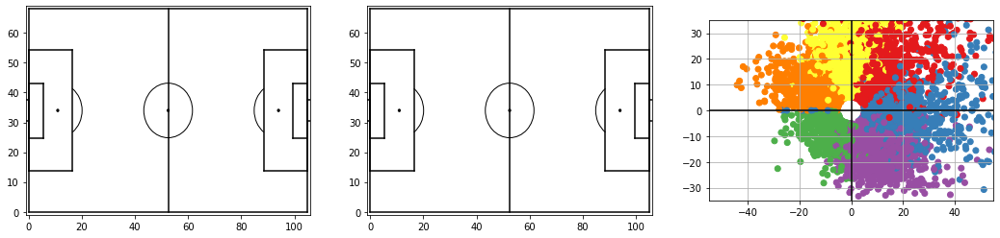

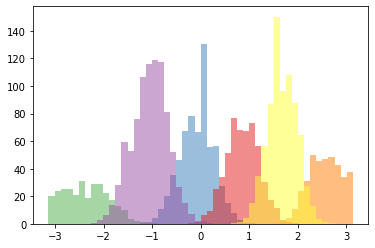

pass_1 3911 1795.3320023160168
['pass_1_0', 'pass_1_1', 'pass_1_2']


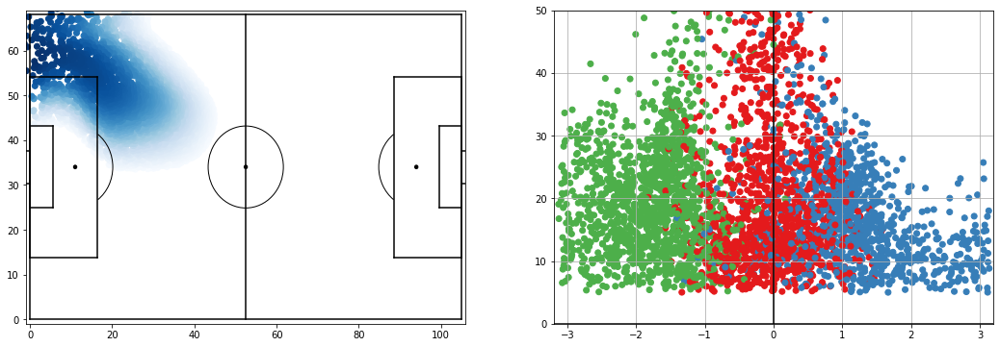

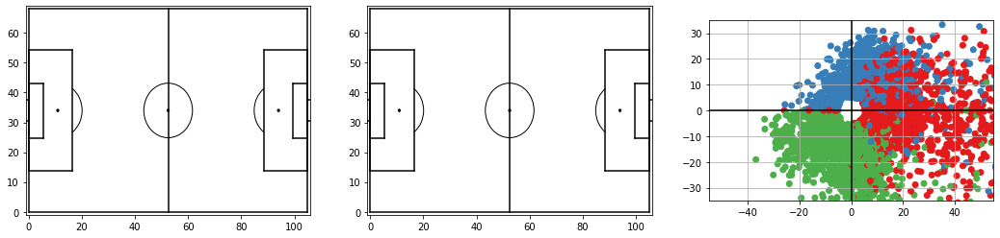

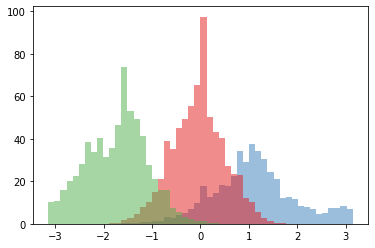

pass_2 3465 1650.8903233321284
['pass_2_0', 'pass_2_1', 'pass_2_2', 'pass_2_3']


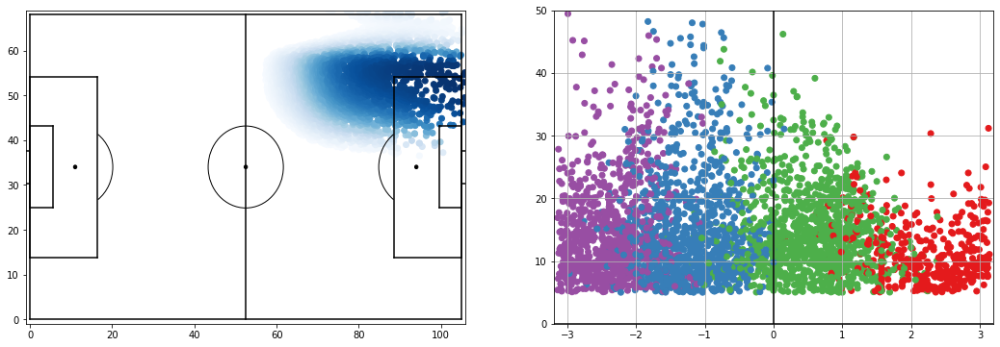

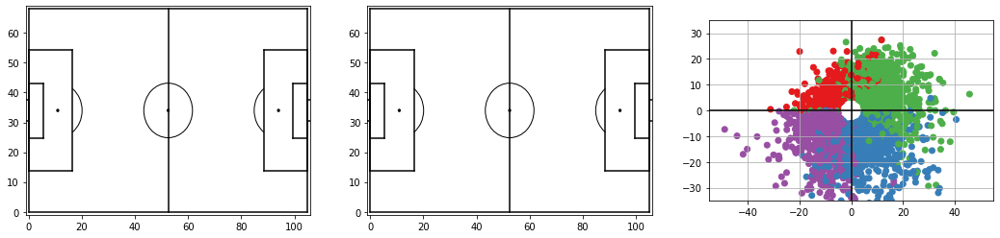

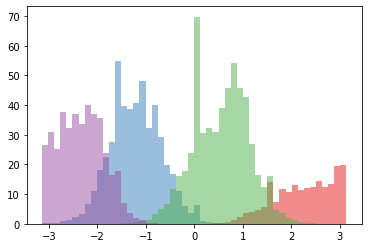

pass_3 4038 1622.2665634002426
['pass_3_0', 'pass_3_1', 'pass_3_2']


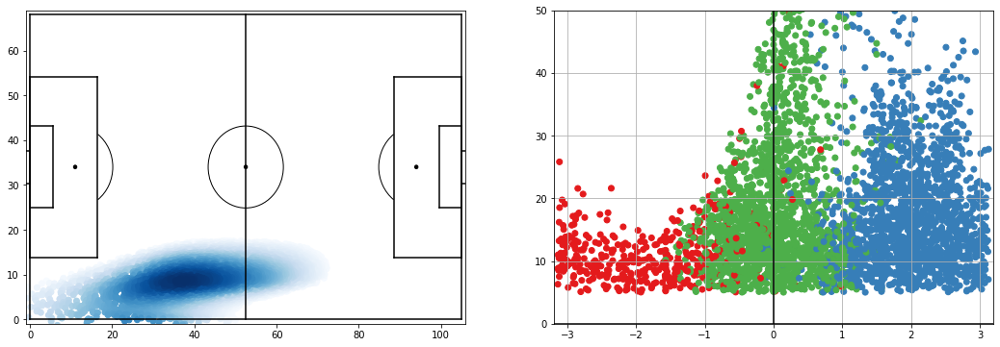

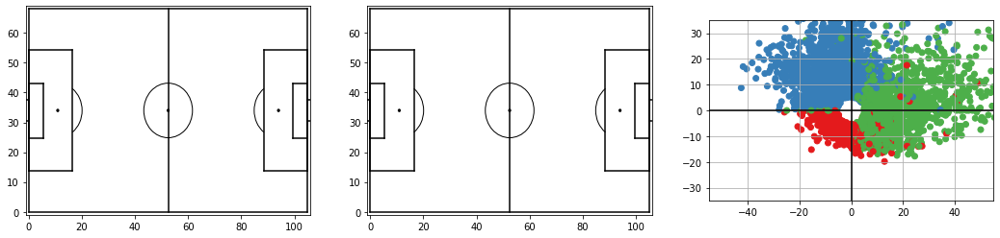

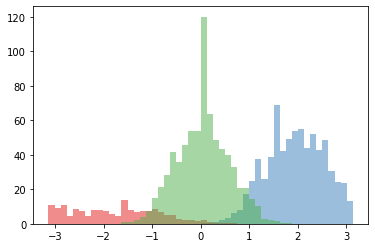

pass_4 4731 1947.4509427753958
['pass_4_0', 'pass_4_1', 'pass_4_2']


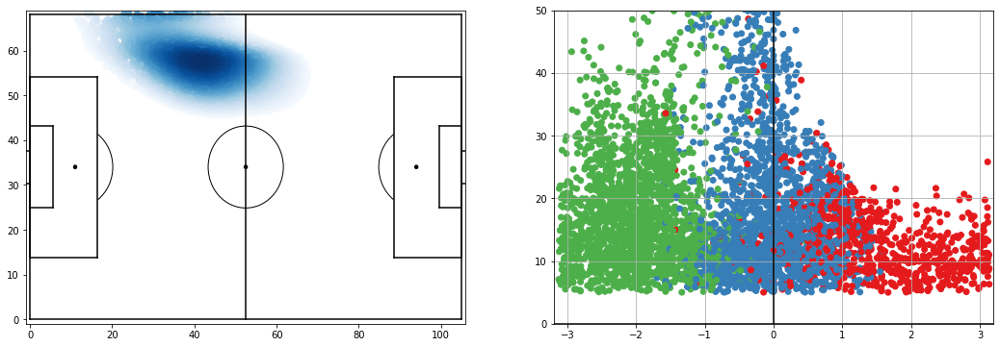

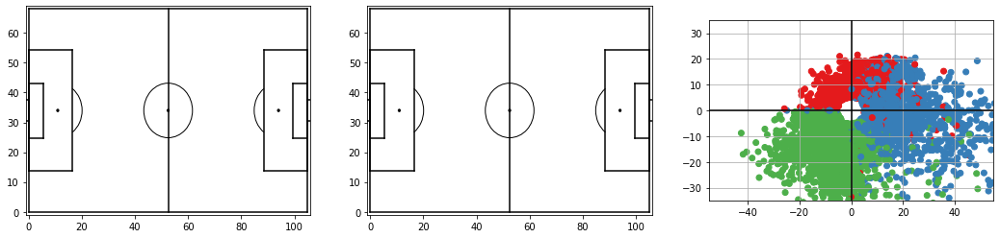

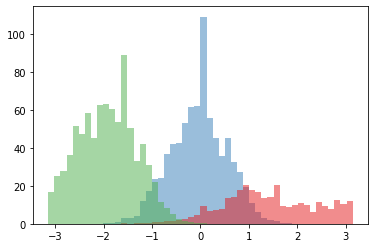

pass_5 3319 2139.4990132553826
['pass_5_0', 'pass_5_1', 'pass_5_2', 'pass_5_3', 'pass_5_4', 'pass_5_5', 'pass_5_6']


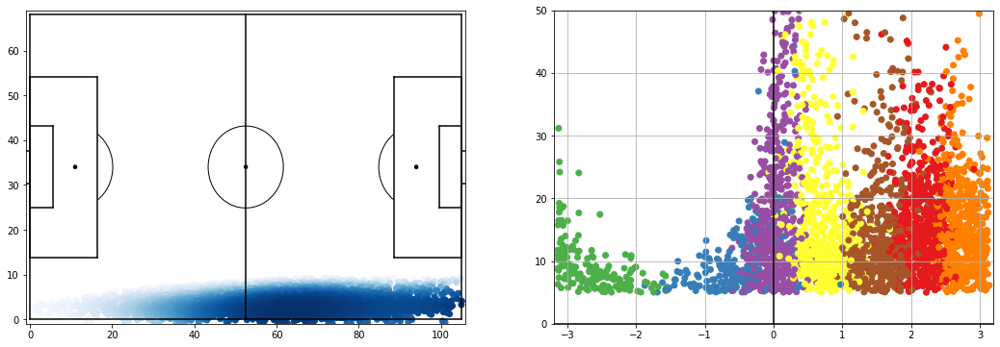

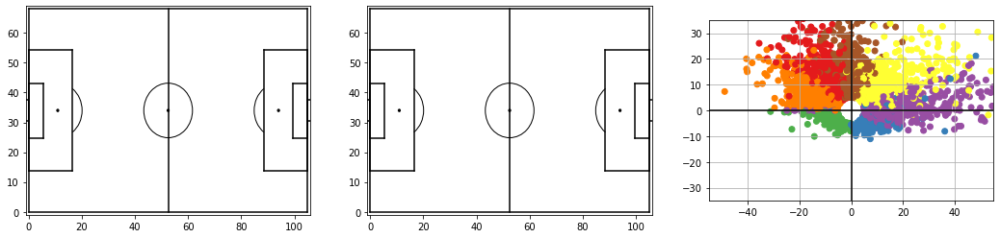

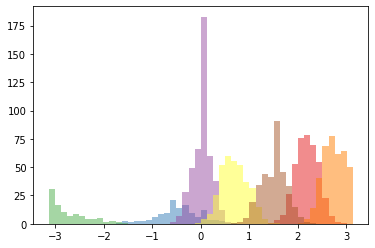

pass_6 1814 1234.2299936869088
['pass_6_0']


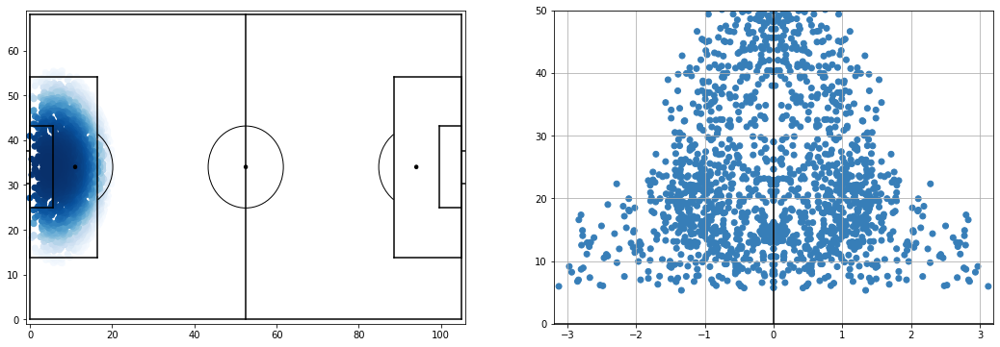

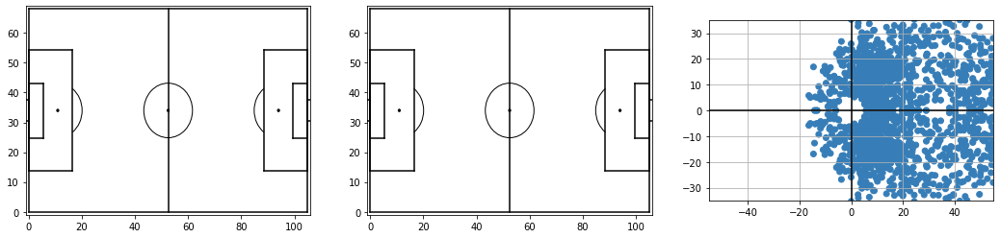

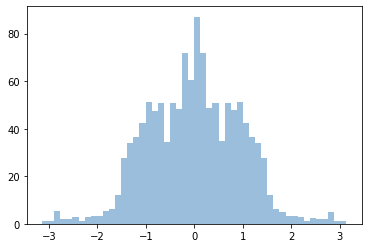

pass_7 8063 3663.0841902365732
['pass_7_0', 'pass_7_1', 'pass_7_2', 'pass_7_3', 'pass_7_4', 'pass_7_5']


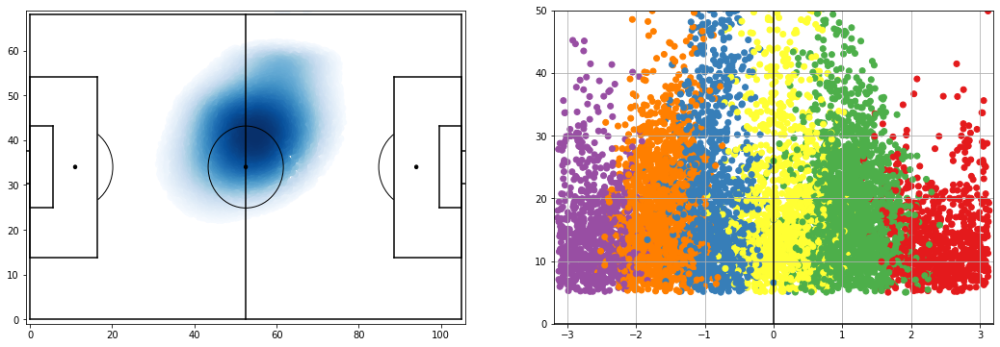

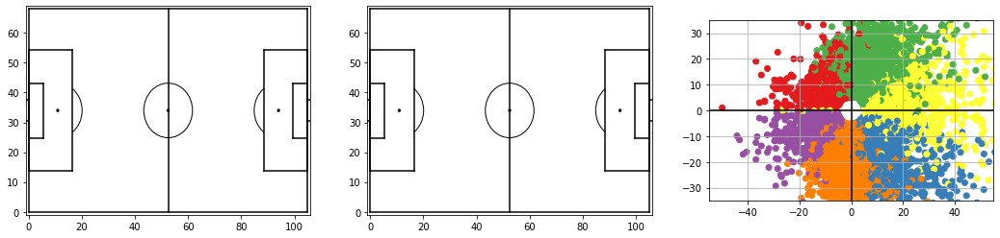

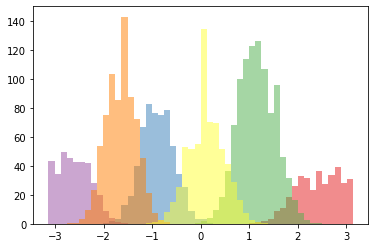

pass_8 2880 1299.2303007726898
['pass_8_0', 'pass_8_1', 'pass_8_2', 'pass_8_3']


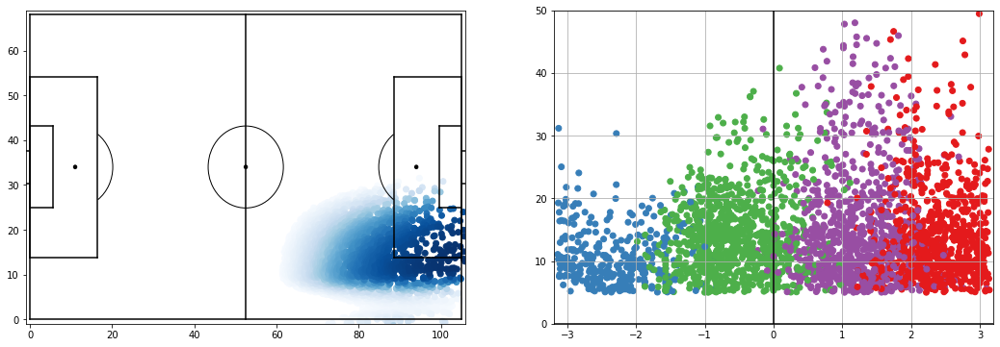

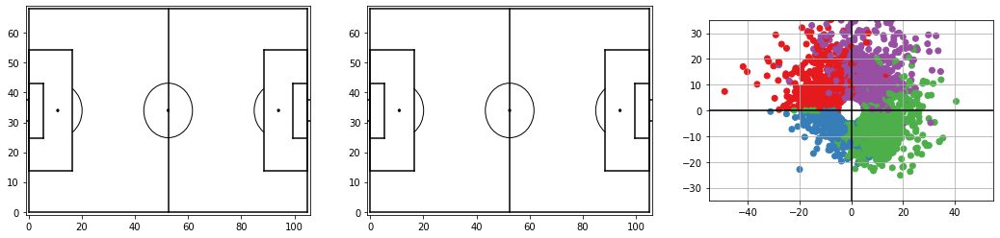

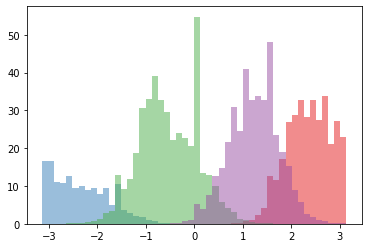

pass_9 3313 1507.1151091583238
['pass_9_0', 'pass_9_1', 'pass_9_2']


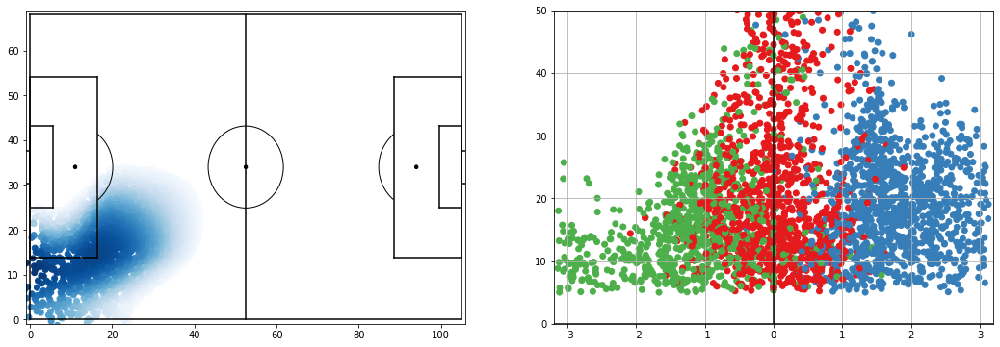

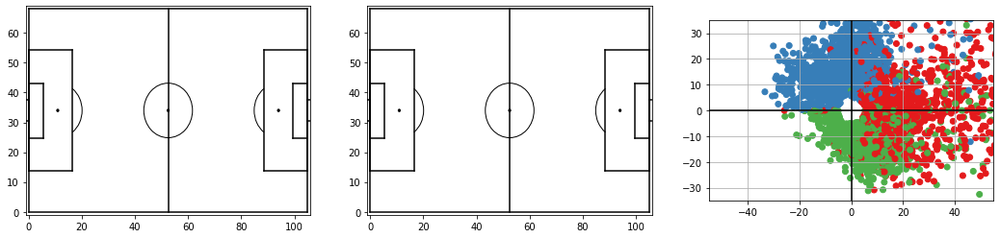

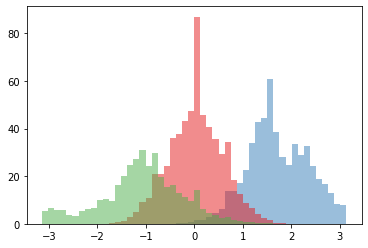

pass_10 7091 2371.620458029635
['pass_10_0', 'pass_10_1']


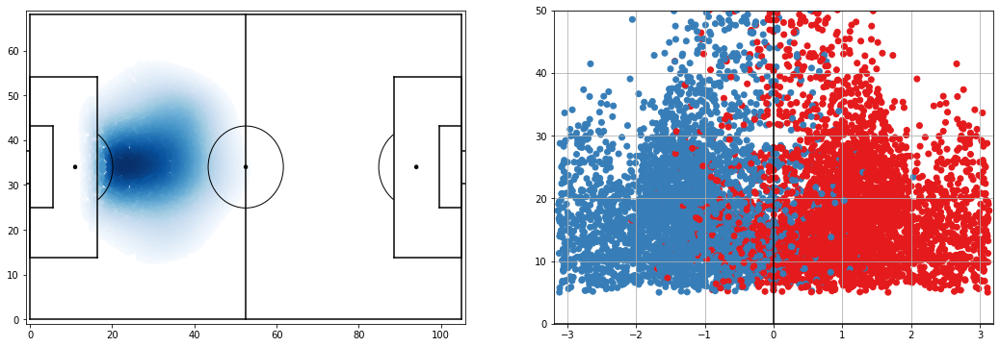

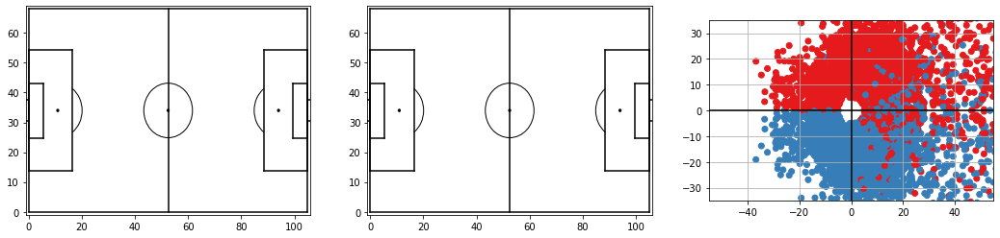

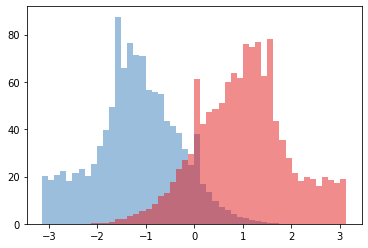

pass_11 4692 1870.059084441077
['pass_11_0', 'pass_11_1']


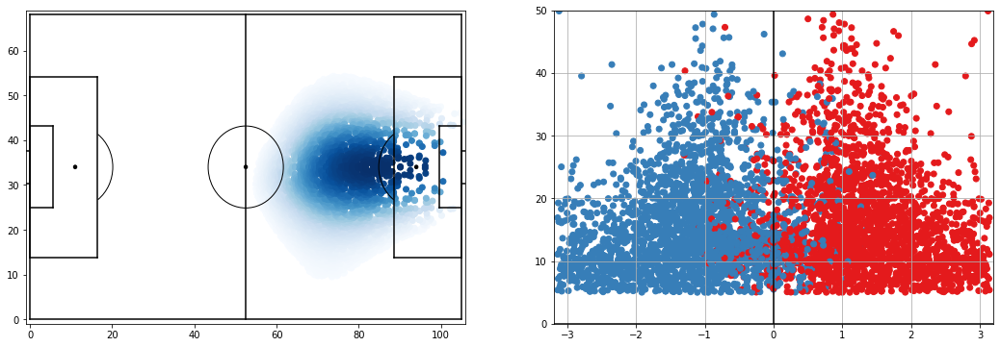

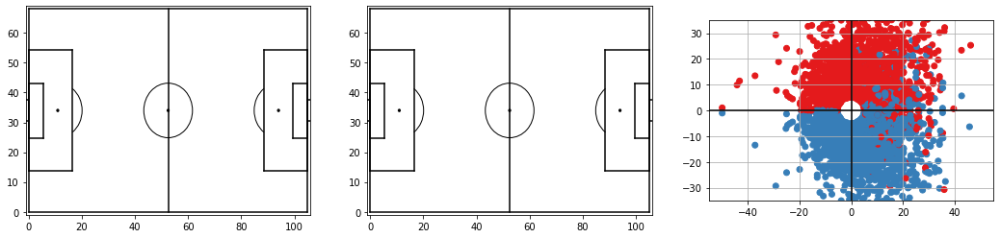

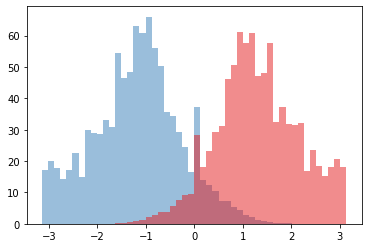

pass_12 3615 2289.945836796269
['pass_12_0', 'pass_12_1', 'pass_12_2', 'pass_12_3', 'pass_12_4', 'pass_12_5', 'pass_12_6']


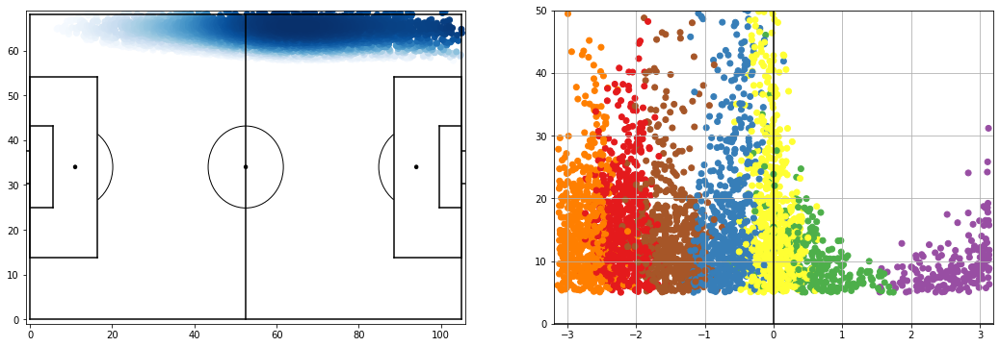

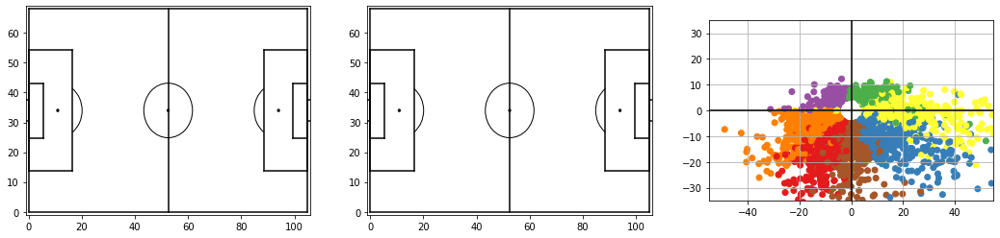

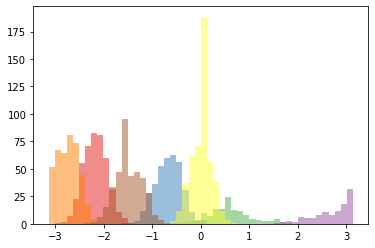

In [45]:
def sample(probs):
    n = len(probs)
    return np.random.choice(n,p=probs/sum(probs))

def scattercolors(actions,weights,samplefn="max"):
    pos_weights_idx = weights.values.sum(axis=1) > 1e-1
    a = actions[pos_weights_idx]
    weights = weights[pos_weights_idx]

    if samplefn == "max":
        labels = np.argmax(weights.values,axis=1)
    else:
        labels = np.apply_along_axis(sample,axis=1, arr=weights.values)

    pcolors = [colors[l % len(colors)] for l in labels]
    return a,pcolors

colors = ["#377eb8",
    "#e41a1c",
    "#4daf4a",
    "#984ea3",
    "#ff7f00",
    "#ffff33",
    "#a65628",
    "#f781bf",
    "#999999",
    ]


for column in w_i.columns:
    if "pass" in column:
        probs = w_i[column]
        pos_prob_idx = probs > 1e-1
        print(column,sum(pos_prob_idx),sum(probs))
        dfc = a.reset_index()[pos_prob_idx].copy()
        dfc["membership"] = probs[pos_prob_idx]
        dfc = dfc.sort_values("membership",ascending=True)

        axs = vis.axesxypolar()
        sc = axs[0].scatter(dfc.x,dfc.y,c=dfc.membership,cmap="Blues")
        #plt.colorbar(sc)
        #axs[1].scatter(dfc.x + dfc.dx,dfc.y + dfc.dy,c=dfc.membership,cmap="Blues")

        columns = list(name for name in w_ii.columns if column + "_" in name)
        print(columns)
        acol,c = scattercolors(a,w_ii[columns],samplefn="uni")
        
        axs[1].scatter(acol.mov_angle_a0,acol.mov_d_a0,c=c)
        plt.show()
        
        axs = vis.axes3()
        axs[2].scatter(acol.dx,acol.dy,c=c)
        plt.show()
        
        for i,co in enumerate(columns):
            weights = w_ii[co].values
            plt.hist(a.mov_angle_a0,bins=50,weights=weights,color=colors[i],alpha=0.5)
        plt.show()

take_on_0 1


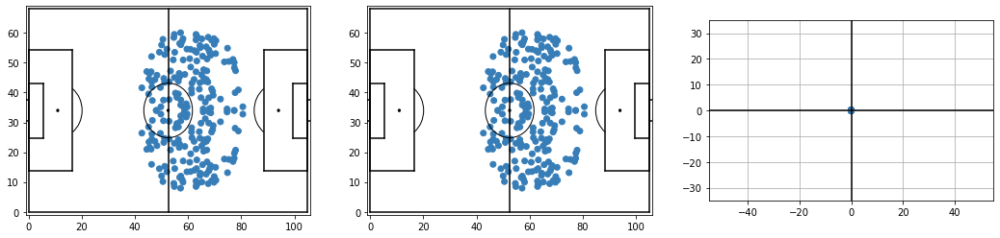

take_on_1 1


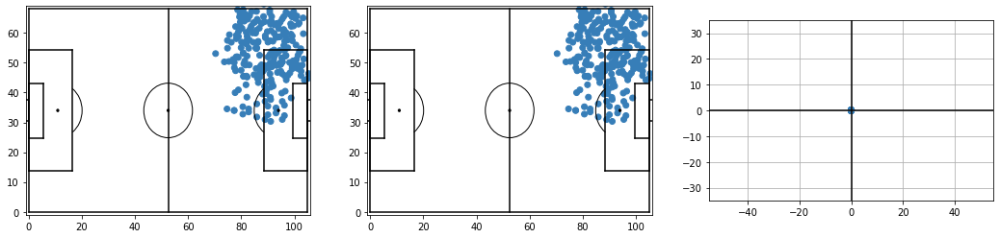

take_on_2 1


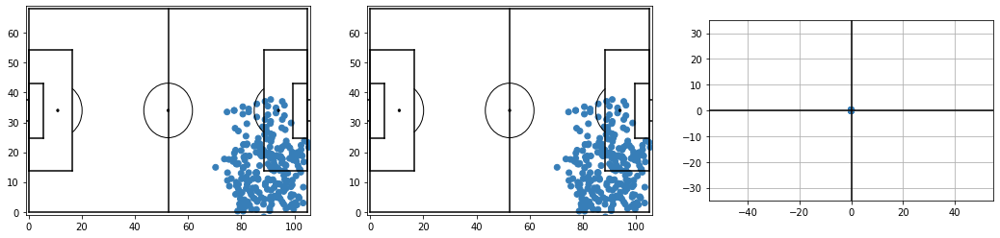

take_on_3 1


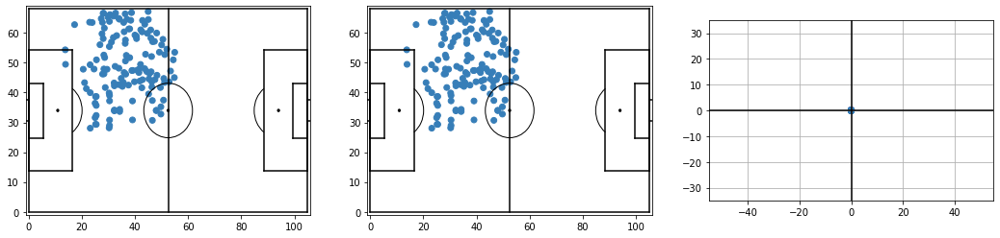

take_on_4 1


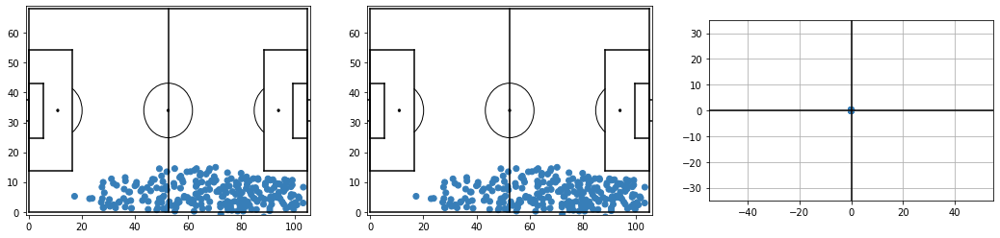

take_on_5 1


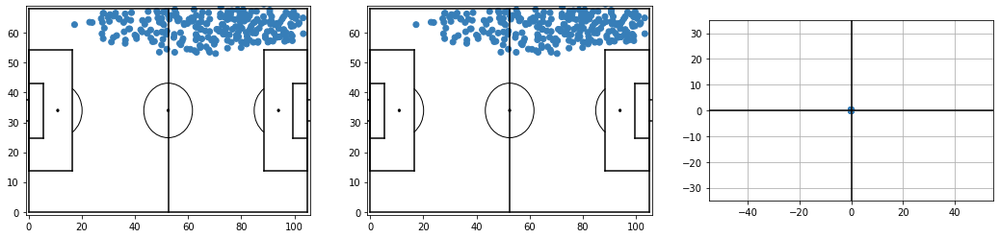

take_on_6 1


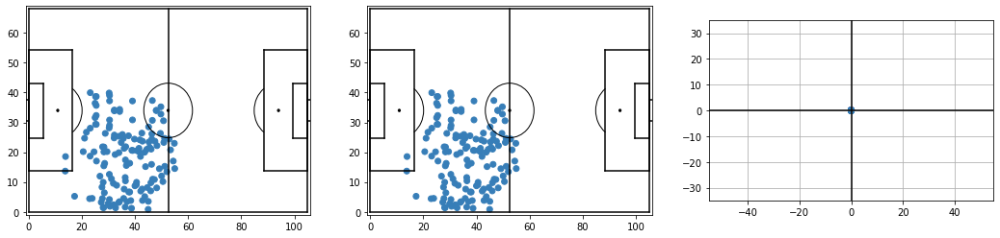

offside_0 1


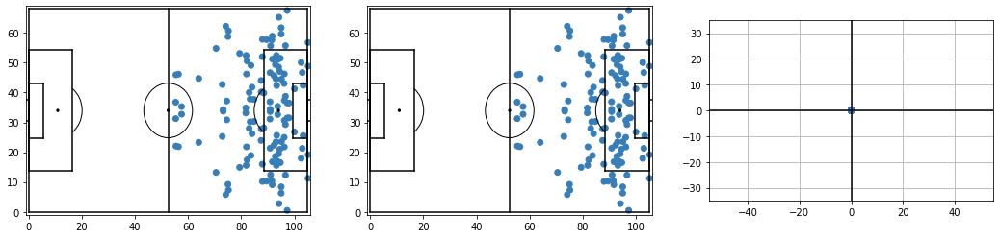

bad_touch_0 1


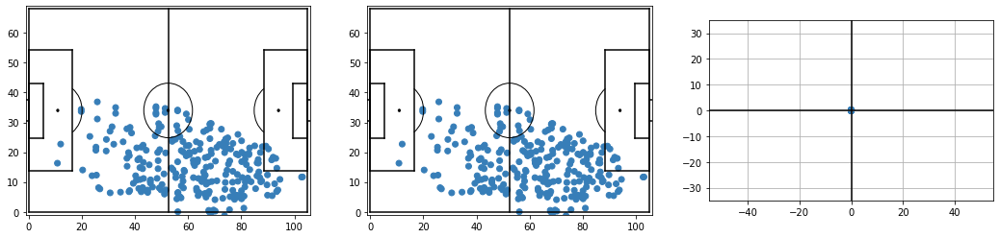

bad_touch_1 1


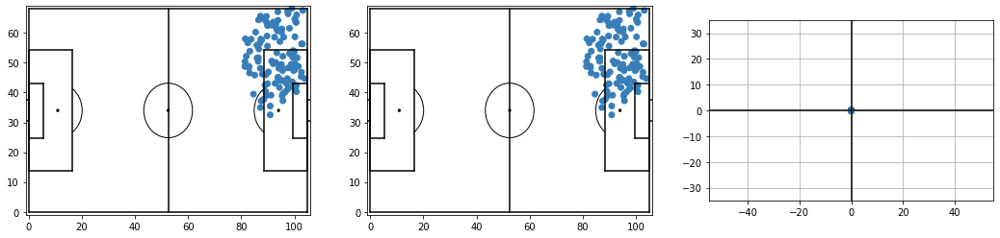

In [78]:
import numpy as np
for prefix in w_i.columns[:10]:
    prefix_columns = list(c for c in w_ii.columns if prefix + "_" in c)
    print(prefix,len(prefix_columns))
    vis.plot_actions(a,w_ii[prefix_columns],samplefn="uni")

out_1_0 626


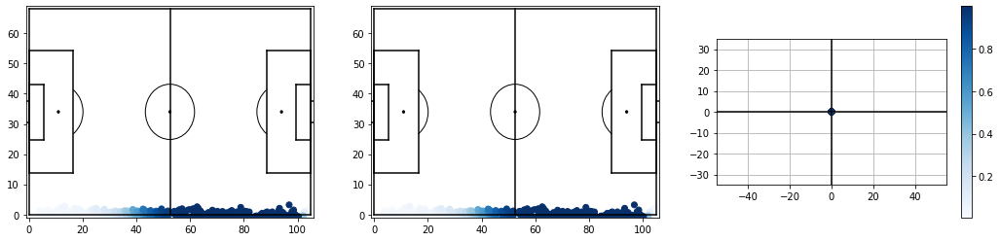

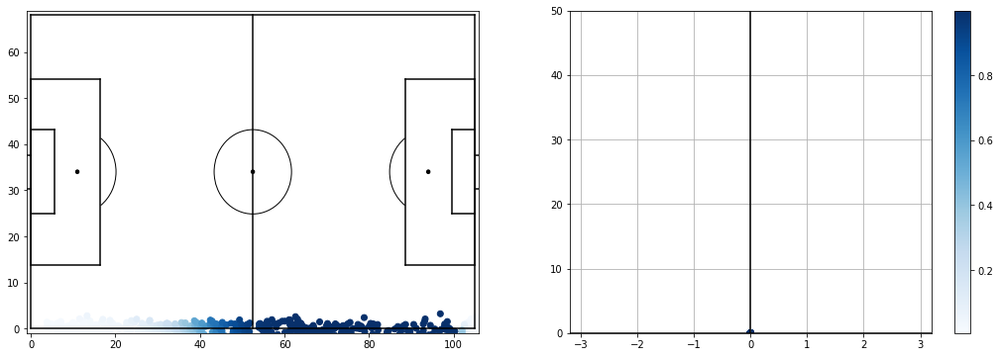

out_2_0 435


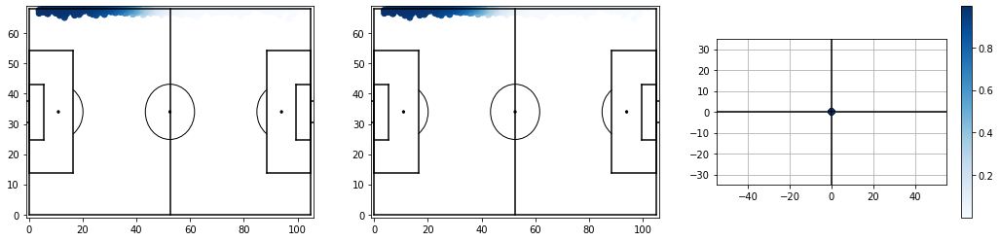

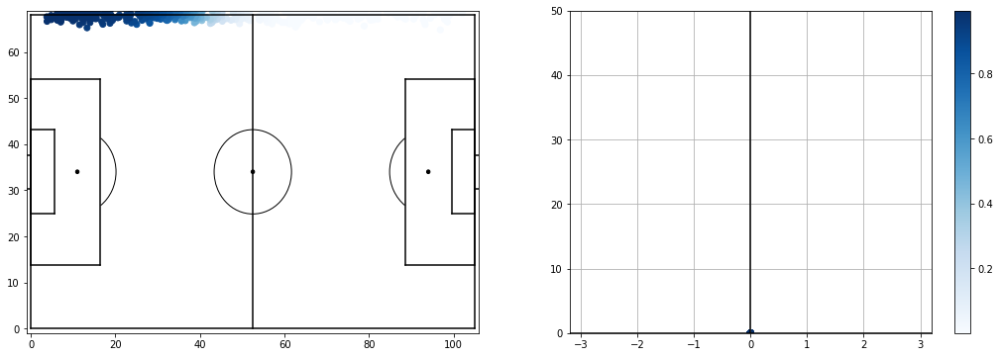

out_3_0 435


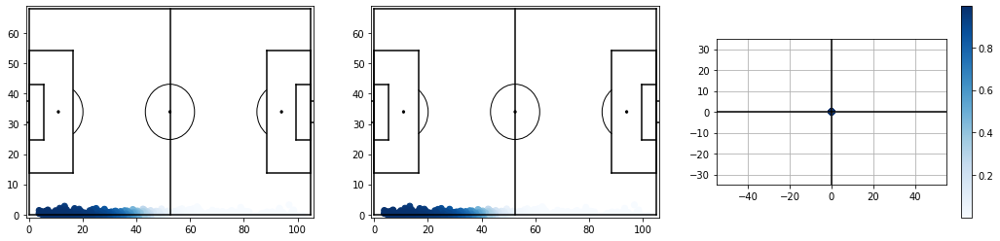

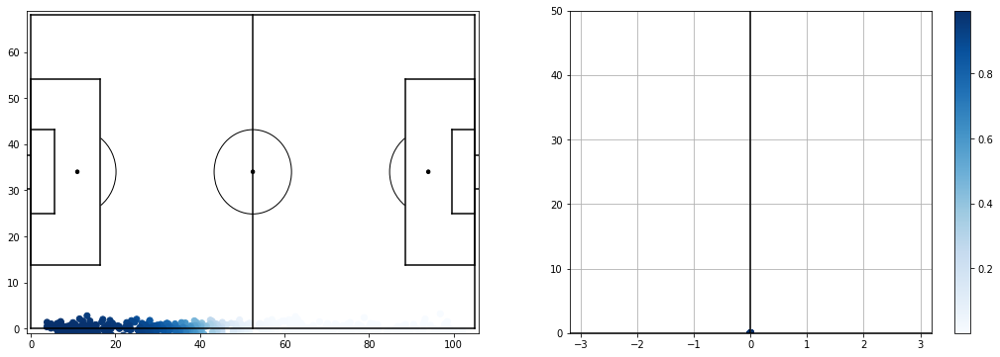

out_4_0 206


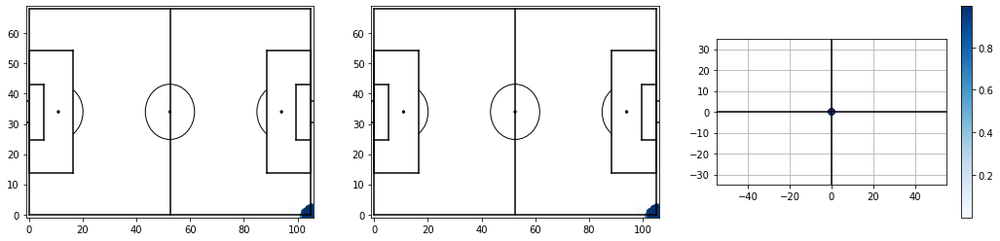

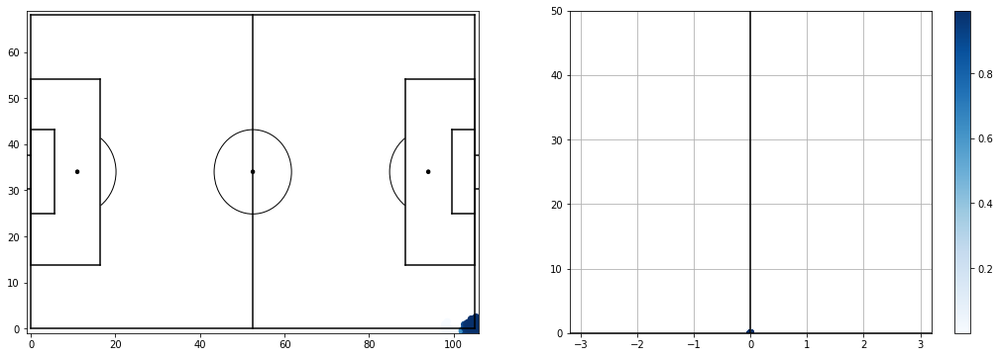

out_5_0 626


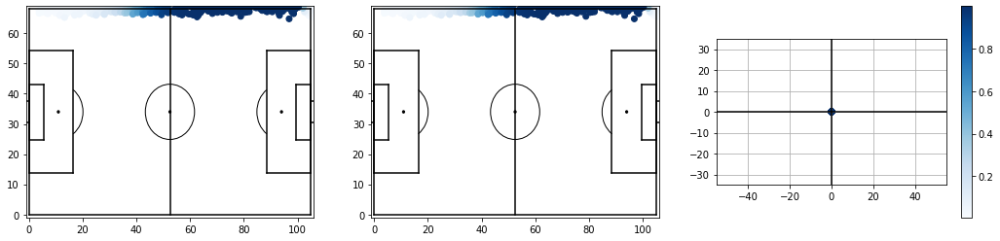

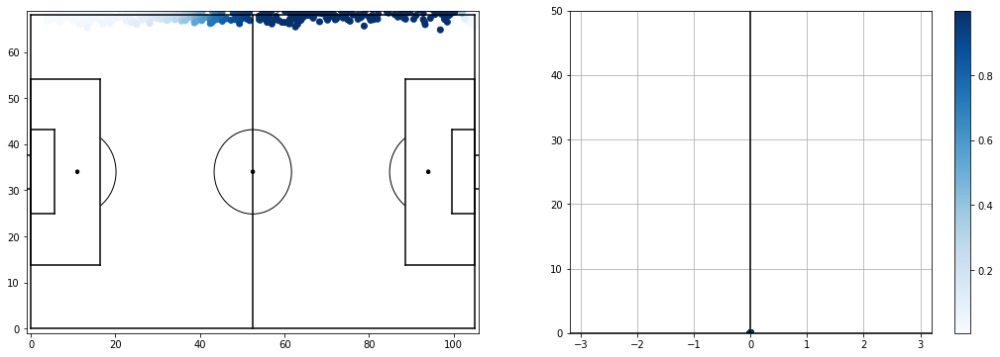

shot_0_0 712


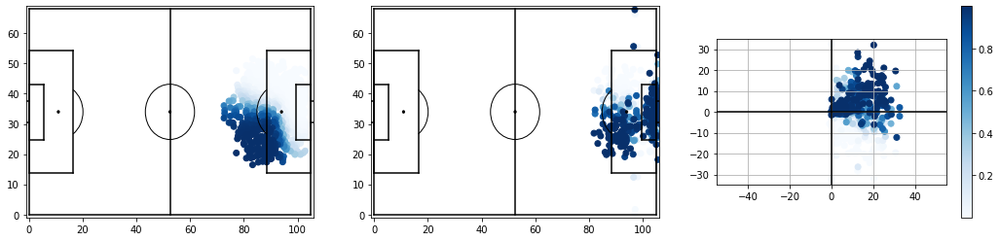

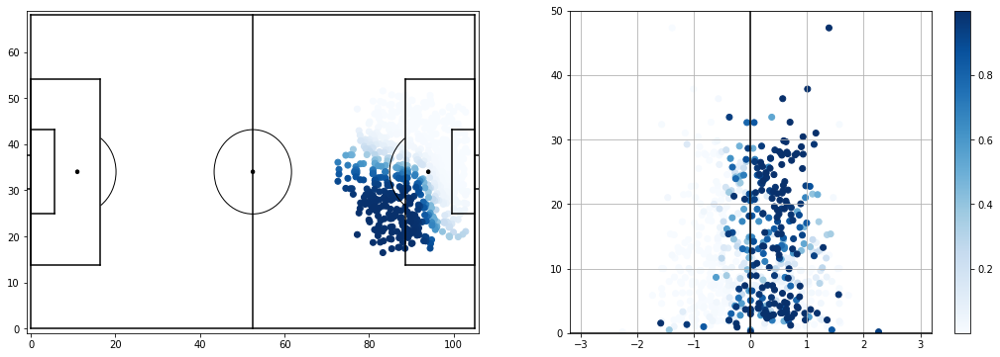

shot_1_0 632


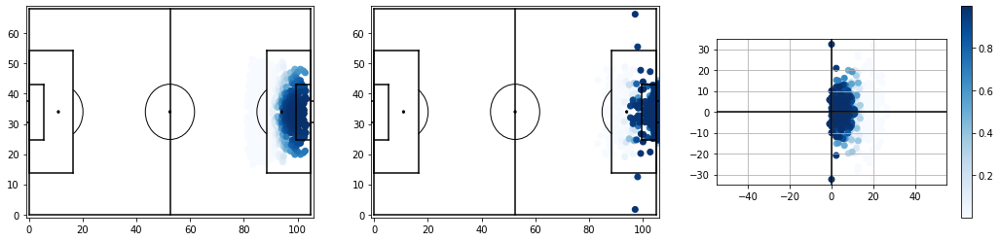

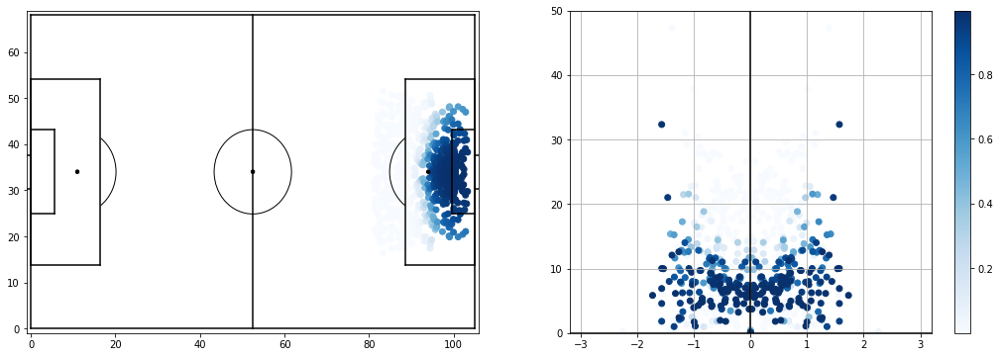

shot_2_0 712


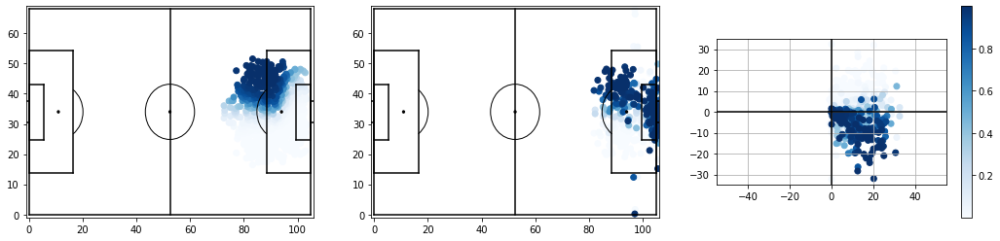

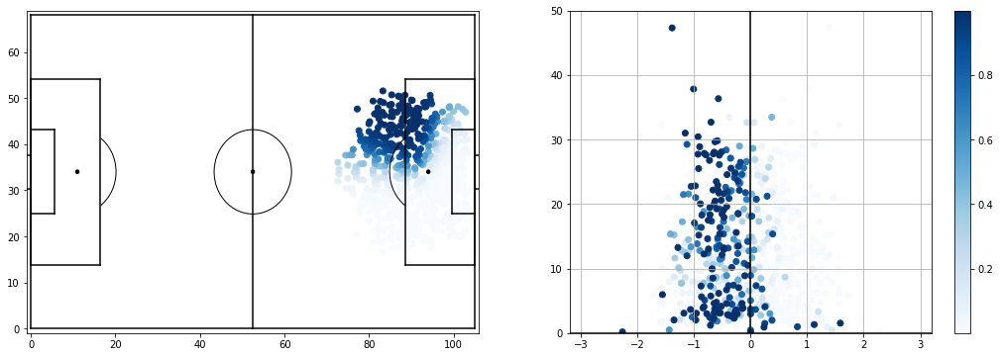

pass_0_0 15909


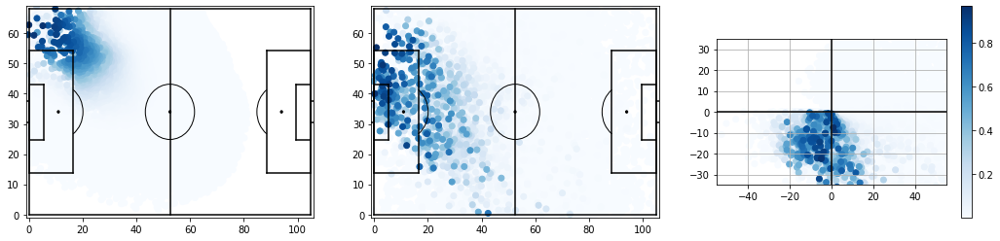

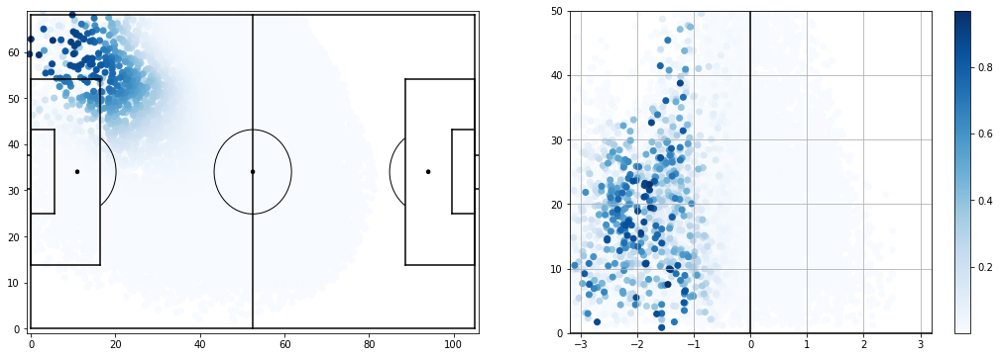

pass_0_1 19637


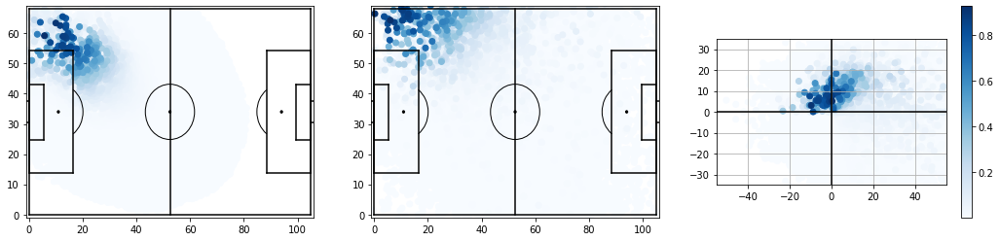

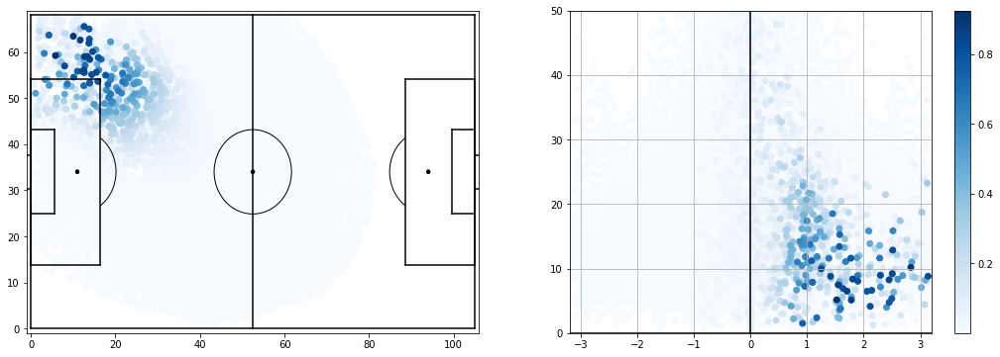

In [75]:
for column in w_ii.columns[50:60]:
    probs = w_ii[column]
    pos_prob_idx = probs > 1e-10
    print(column,sum(pos_prob_idx))
    dfc = a.reset_index()[pos_prob_idx].copy()
    dfc["membership"] = probs[pos_prob_idx]
    dfc = dfc.sort_values("membership",ascending=True)

    axs = vis.axes3()
    sc = axs[0].scatter(dfc.x,dfc.y,c=dfc.membership,cmap="Blues")
    plt.colorbar(sc)
    axs[1].scatter(dfc.x + dfc.dx,dfc.y + dfc.dy,c=dfc.membership,cmap="Blues")
    axs[2].scatter(dfc.dx,dfc.dy,c=dfc.membership,cmap="Blues")
    plt.show()

    axs = vis.axesxypolar()
    sc = axs[0].scatter(dfc.x,dfc.y,c=dfc.membership,cmap="Blues")
    plt.colorbar(sc)
    #axs[1].scatter(dfc.x + dfc.dx,dfc.y + dfc.dy,c=dfc.membership,cmap="Blues")
    axs[1].scatter(dfc.mov_angle_a0,dfc.mov_d_a0,c=dfc.membership,cmap="Blues")
    #axs[1].hist(dfc.mov_angle_a0)
    
    plt.show()